# Explorando patrones ocultos: Detección de Anomalías en datos

## Detección de anomalías

Los transformadores juegan un papel muy importante en el sistema eléctrico. Aunque son algunos de los componentes más confiables de la red eléctrica, también son propensos a fallar debido a muchos factores, tanto internos como externos. Podría haber muchos iniciadores que causen una falla en el transformador, pero los que potencialmente pueden conducir a una falla catastrófica son los siguientes:
Falla mecánica
Falla dieléctrica

Contenido
Estos datos se recopilaron a través de dispositivos IoT desde el 25 de junio de 2019 hasta el 14 de abril de 2020 y se actualizaron cada 15 minutos.
El dataset contiene 19352 registros.
Descripción de los parámetros:
Voltaje de corriente:
1. VL1- Fase Línea 1
2. VL2- Fase Línea 2
3. VL3- Fase Línea 3
4. IL1- Línea actual 1
5. IL2- Línea actual 2
6. IL3- Línea actual 3
7. VL12- Línea de tensión 1 2
8. VL23- Línea de tensión 2 3
9. VL31- Línea de tensión 3 1
10. INUT-Corriente neutra

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# se carga el dataset, con separados ;, se transforman las dos columnas Date y Time a una única columna con tipo datetime
# en el fichero CSV existen NaN identificados por ?
df = pd.read_csv('CurrentVoltage.csv', sep=',') 

#### ¿Cuántas instancias tiene el dataset?

In [3]:
print(f'Número de registros (filas): {df.shape[0]}')
print(f'Número de variables: {df.shape[1]}')

Número de registros (filas): 19352
Número de variables: 11


#### ¿Cuál es el tipo de datos predominante en las variables?

In [4]:
print("\nTipos de datos:")
print(df.dtypes)


Tipos de datos:
DeviceTimeStamp     object
VL1                float64
VL2                float64
VL3                float64
IL1                float64
IL2                float64
IL3                float64
VL12               float64
VL23               float64
VL31               float64
INUT               float64
dtype: object


## Variables nulas

#### ¿Tiene este dataset datos faltantes?

In [5]:
print("\nValores nulos por columna:")
print(df.isnull().sum())


Valores nulos por columna:
DeviceTimeStamp    0
VL1                0
VL2                0
VL3                0
IL1                0
IL2                0
IL3                0
VL12               0
VL23               0
VL31               0
INUT               0
dtype: int64


Podemos ver que no tenemos datos nulos 'NaN' en ninguna de las columnas.

#### ¿Es necesario hacer algún tratamiendo adicional sobre los datos?
Para poder determinar si es neceario hacer algún tratamiendo adicional sobre los datos vamos a realizar un EDA de los mismos.

Lo primero, es que la variable 'DeviceTimeStamp' la vamos a convertir a formato datetime para poder trabajar más comodamente con ella.

In [6]:
# Comprobamos si las fechas son consistentes y convertimos la columna 'DeviceTimeStamp' a tipo datetime
df['DeviceTimeStamp'] = pd.to_datetime(df['DeviceTimeStamp'], errors='coerce')

df_original = df.copy()

A continuación, vemos las estadísticas de todas las variables

In [7]:
# Estadísticas descriptivas
print("\nEstadísticas descriptivas de las variables numéricas:")
display(df.describe())


Estadísticas descriptivas de las variables numéricas:


,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
count,19352,19352.000000,19352.000000,19352.000000,19352.000000,19352.000000,19352.000000,19352.00000,19352.000000,19352.000000,19352.000000
mean,2019-11-06 10:30:04.545266944,241.068019,240.515456,239.912293,73.710857,58.970592,83.226555,379.47530,378.526261,379.969311,26.315187
min,2019-06-25 13:06:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,2019-08-22 00:56:15,235.400000,235.100000,235.100000,46.775000,31.500000,56.300000,400.70000,401.300000,401.900000,16.800000
50%,2019-10-27 13:52:30,242.700000,242.100000,241.100000,69.500000,50.200000,80.200000,417.80000,416.300000,417.900000,25.600000
75%,2020-01-29 16:18:45,247.500000,246.700000,245.300000,100.100000,82.500000,113.900000,427.50000,425.300000,427.600000,35.700000
max,2020-04-14 00:30:00,261.200000,261.300000,261.300000,224.100000,253.600000,247.300000,446.50000,444.800000,447.300000,145.800000
std,NaN,9.536380,9.801129,8.846213,41.256800,40.463867,43.609360,119.96308,119.417113,120.074752,15.103268


En usos domésticos, la tensión nominal entre fases es de 240V y entre fase y neutro de 120V, mientras que el voltaje de la linea neutra deberia ser de 0V.
Con esta información vemos que los datos de las variables VL1, VL2 y VL3 parecen ser correctos y que entran dentro de un rango lógico. Sin embargo la linea de Neutro no deberia tener valores tan áltos como 145V, y debería dar un voltaje de 0.
En cuanto a las lineas IL1, IL2 e IL3, parece que indican el consumo real de cada una de las líneas de la red eléctrica doméstica, con un consumo medio normal, pero con picos de 224-253V, lo que podría indicar una subida de la tensión en esa línea.
Asimismo, las linea VL12, VL23 Y VL31 parecen tener valores dentro del rango lógico de 400V al ser lineas de voltaje trifásicas.

El dato que más nos llama la atención es ver que el mínimo en todas es 0, por lo que en algun momento no ha habido corriente en el domicilio o los sensores no estaban conectados.


Con estos datos no parece que tengamos ninguna variable categórica, pero por si acaso lo comprobamos mirando el número de valores únicos por cada columna.

In [8]:
# Verificamos si existe alguna columna categórica que podría representar clases
print("\nValor único por columna:")
print(df.nunique())


Valor único por columna:
DeviceTimeStamp    18915
VL1                  508
VL2                  480
VL3                  495
IL1                 1638
IL2                 1685
IL3                 1673
VL12                 769
VL23                 749
VL31                 776
INUT                 757
dtype: int64


Efectivamente, no podemos considerar ninguna variable categórica, todas son numéricas.

A continuación vamos a mostrar la distribución de todas las variables.

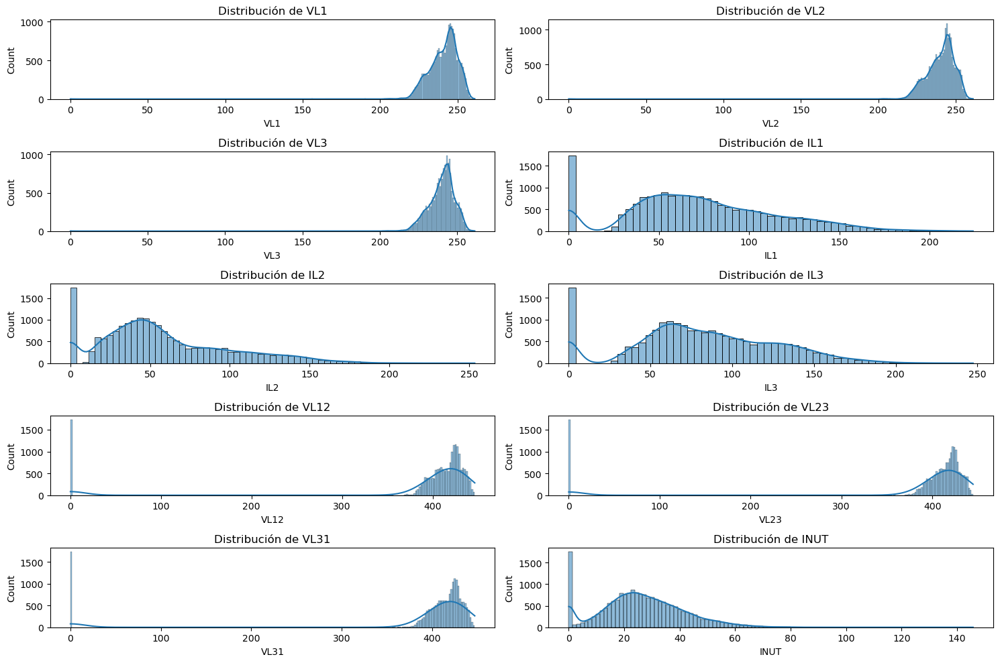

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Creamos histogramas y gráficos KDE para cada variable numérica
numerical_cols = ['VL1', 'VL2', 'VL3', 'IL1', 'IL2', 'IL3', 'VL12', 'VL23', 'VL31', 'INUT']

# Configuración de la figura
plt.figure(figsize=(15, 10))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 2, i)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribución de {col}')

plt.tight_layout()
plt.show()

Lo que vemos coincide en grán medida con los datos estadísticos analizados previamente, mostrando cláramente los valore tipicos de cada columna. De nuevo nos fijamos en que el valor 0 está muy presente en 7 variables, por lo que vamos a centrarnos en esta valor.

Analicemos primoerop cuántos ceros hay en cada una de las variables en las que el 0 es un valor prominente de la distribución.

In [10]:
# Analizamos cuántos registros con valor 0 hay en cada una de las variables
zero_counts = (df[['IL1', 'IL2', 'IL3', 'VL12', 'VL23', 'VL31', 'INUT']] == 0).sum()
print("\nCantidad de ceros por variable:")
print(zero_counts)

# Calculamos la proporción de ceros en relación al total de registros
zero_percentage = (zero_counts / df.shape[0]) * 100
print("\nPorcentaje de ceros por variable:")
print(zero_percentage)



Cantidad de ceros por variable:
IL1     1574
IL2     1663
IL3     1662
VL12    1730
VL23    1729
VL31    1732
INUT    1653
dtype: int64

Porcentaje de ceros por variable:
IL1     8.133526
IL2     8.593427
IL3     8.588260
VL12    8.939644
VL23    8.934477
VL31    8.949979
INUT    8.541753
dtype: float64


Vemos que en todas ellas el valor ronda lo 1500-1700 registros y entre un 8-9% de los datos, lo que sugiere un patrón oculto.

Analicemos si esto puede estar relacionado con un exceso de mediciones en alguna fecha concreta en la que se produjo alguna avería o alguna situación inusual viendo la distribución de registros por cada fecha de nuestro conjunto de datos.


Cantidad de registros por día:


Date
2019-06-25      1
2019-06-27    343
2019-06-28    531
2019-06-29    452
2019-07-01     14
             ... 
2020-04-10     97
2020-04-11     95
2020-04-12    102
2020-04-13     95
2020-04-14      3
Length: 218, dtype: int64


Días sin datos:


{Timestamp('2019-06-25 00:00:00'),
 Timestamp('2019-06-26 00:00:00'),
 Timestamp('2019-06-27 00:00:00'),
 Timestamp('2019-06-28 00:00:00'),
 Timestamp('2019-06-29 00:00:00'),
 Timestamp('2019-06-30 00:00:00'),
 Timestamp('2019-07-01 00:00:00'),
 Timestamp('2019-07-02 00:00:00'),
 Timestamp('2019-07-03 00:00:00'),
 Timestamp('2019-07-04 00:00:00'),
 Timestamp('2019-07-05 00:00:00'),
 Timestamp('2019-07-06 00:00:00'),
 Timestamp('2019-07-07 00:00:00'),
 Timestamp('2019-07-08 00:00:00'),
 Timestamp('2019-07-09 00:00:00'),
 Timestamp('2019-07-10 00:00:00'),
 Timestamp('2019-07-11 00:00:00'),
 Timestamp('2019-07-12 00:00:00'),
 Timestamp('2019-07-13 00:00:00'),
 Timestamp('2019-07-14 00:00:00'),
 Timestamp('2019-07-15 00:00:00'),
 Timestamp('2019-07-16 00:00:00'),
 Timestamp('2019-07-17 00:00:00'),
 Timestamp('2019-07-18 00:00:00'),
 Timestamp('2019-07-19 00:00:00'),
 Timestamp('2019-07-20 00:00:00'),
 Timestamp('2019-07-21 00:00:00'),
 Timestamp('2019-07-22 00:00:00'),
 Timestamp('2019-07-

C:\Users\acamo\AppData\Local\Temp\ipykernel_40780\254006413.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Date', data=df, palette='viridis')


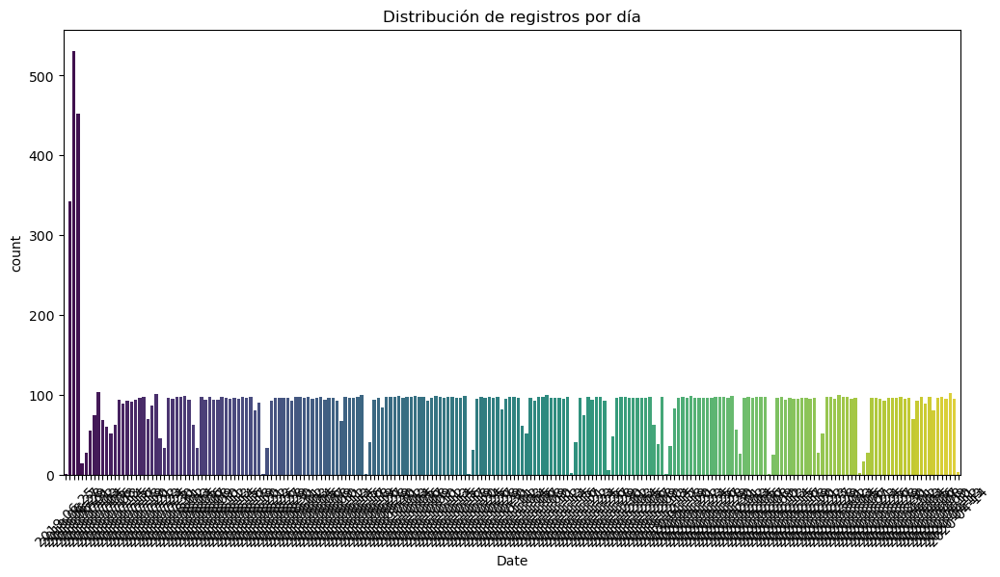

In [11]:
# Extraemos solo la fecha sin la hora
df['Date'] = df['DeviceTimeStamp'].dt.date

# Contamos cuántos registros hay por cada día
daily_data_count = df.groupby('Date').size()

# Visualizamos la cantidad de registros por día
print("\nCantidad de registros por día:")
display(daily_data_count)

# La de los días sin datos
all_days = pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='D')
missing_days = set(all_days) - set(daily_data_count.index)

print("\nDías sin datos:")
display(missing_days)

# Y finalmente la distribución de registros por día (gráfico de barras)
plt.figure(figsize=(12, 6))
sns.countplot(x='Date', data=df, palette='viridis')
plt.title('Distribución de registros por día')
plt.xticks(rotation=45)
plt.show()


Vemos que los registros por dia de los días iniciales en los que se empieza a recolectar datos tienen unos valore atípicos, rondando los 300-500 registros y no siendo consistentes con el resto de mediciones que se han tomado durante el resto del año. Esto parece indicar que durante la instalaciópn de los sensores se hicieron numerosas pruebas para determinar su funcionamiento y que se fue ajustando poco a poco la frecuencia con la que se hacían las mediciones hasata que se fijó en una frecuencia de 15 minutos.

También podemos ver que tenemos numerosos días en los que no se han realizado mediciones, no que estas fechas aparezcan con ceros, sino que directamente esas fechas no aparecen en el dataset.

Centrémonos de nuevo en la cantidad de mediciones realizadas estos días. Si sacamos la media, que parece rondar las 100 mediciones, podríamos determinar si los registros de los primeros días pueden considerarse como datos anómalos y poder descartarlos.


Media de mediciones por día: 88.77

Días con mediciones significativamente mayores o menores a la media:


Date
2019-06-27    343
2019-06-28    531
2019-06-29    452
dtype: int64

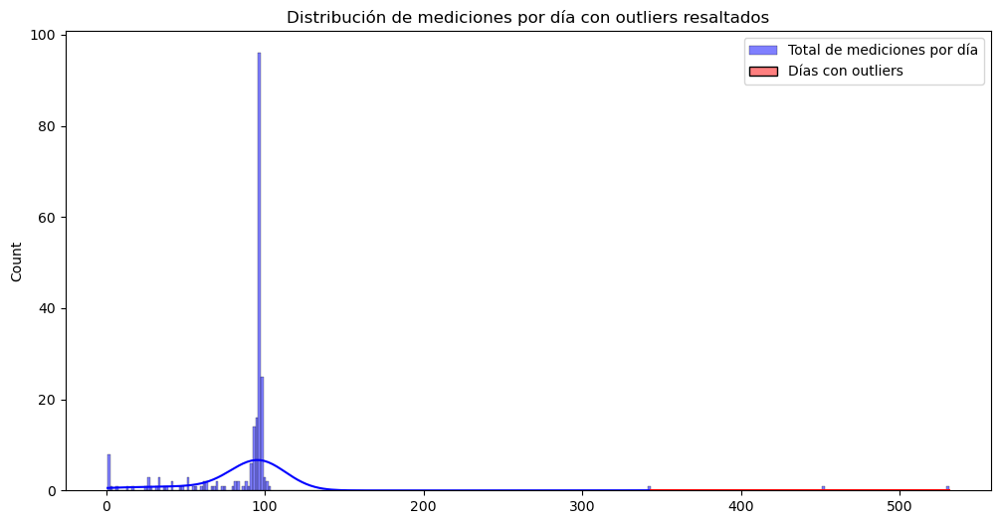

In [12]:
# Calculamos la media de mediciones al día
mean_measurements = daily_data_count.mean()

# Y la desviación estándar 
std_measurements = daily_data_count.std()

# Identificamos los días con mediciones significativamente mayores o menores a la media
outlier_days = daily_data_count[(daily_data_count > mean_measurements + 2 * std_measurements) | 
                                  (daily_data_count < mean_measurements - 2 * std_measurements)]

# Y mostramos la media de mediciones por día
print(f"\nMedia de mediciones por día: {mean_measurements:.2f}")

# Los días con mediciones significativamente mayores o menores a la media
print("\nDías con mediciones significativamente mayores o menores a la media:")
display(outlier_days)

# Y una visiallización de la distribución de mediciones por día con los outliers resaltados
plt.figure(figsize=(12, 6))
sns.histplot(daily_data_count, kde=True, color='blue', label='Total de mediciones por día')
sns.histplot(outlier_days, kde=True, color='red', label='Días con outliers', stat='density')
plt.title('Distribución de mediciones por día con outliers resaltados')
plt.legend()
plt.show()


Vemos que tenemos una media de 89 mediciones al dia, y aunque hay fechas con menos mediciones (incuso 0 mediciones), esto sigue entrando dentro de lo que consideraríamos normal, pero justamente los días 27-29 de junio, que es cuando empiezan las mediciones, si que se considera un número anormal de mediciones, por lo que eliminar los datos de estos días está encima de la mesa.

Pero si vamos más allá, el total de registros de estos tres días es de 1300, un número relativamente cercano a la cantidad de ceros que observábamos en algunas de las columnas. 
Puede que el patrón que buscásemos fuese este, los días de inicio de la instalación. 

Para indagar más en este asunto, vamos a calcular cuando se empezaron a hacer mediciones distintas de cero con respecto a la fecha de inicio de los datos.

In [13]:
# Inicializamos un diccionario para almacenar los resultados
first_non_zero_times = {}
zero_counts = {}

# Recorremos cada columna numérica para encontrar el primer valor distinto de 0 y contar los ceros hasta esa fecha
for column in numerical_cols:
    # Filtramos los registros hasta el primer valor distinto de 0
    non_zero_data = df[df[column] != 0]
    
    if not non_zero_data.empty:
        # Obtenemos la primera fecha en la que el valor es distinto de 0
        first_non_zero_time = non_zero_data['DeviceTimeStamp'].min()
        
        # Filtramos los datos hasta esa fecha
        filtered_data = df[df['DeviceTimeStamp'] <= first_non_zero_time]
        
        # Contamos los registros con valor es 0 dentro de ese intervalo
        zero_count = (filtered_data[column] == 0).sum()
        zero_counts[column] = zero_count
        
        # Calculamos el tiempo transcurrido desde el inicio de las mediciones hasta el primer valor distinto de 0
        time_diff = first_non_zero_time - df['DeviceTimeStamp'].min()
        first_non_zero_times[column] = time_diff

# Convertimos los resultados a un DataFrame
first_non_zero_times_df = pd.DataFrame(list(first_non_zero_times.items()), columns=['Column', 'Time until first non-zero'])
zero_counts_df = pd.DataFrame(list(zero_counts.items()), columns=['Column', 'Zero Count'])

# Unimos ambos DataFrames por la columna 'Column'
result_df = pd.merge(first_non_zero_times_df, zero_counts_df, on='Column')

# Mostramos los resultados
display(result_df.head(20))


,Column,Time until first non-zero,Zero Count
0,VL1,1 days 21:43:00,1
1,VL2,1 days 21:43:00,1
2,VL3,1 days 21:43:00,1
3,IL1,5 days 23:26:00,1330
4,IL2,10 days 23:26:00,1651
5,IL3,10 days 23:26:00,1651
6,VL12,17 days 22:45:00,1729
7,VL23,17 days 22:45:00,1729
8,VL31,17 days 22:45:00,1729
9,INUT,5 days 23:26:00,1330


Con esta información podemos suponer que VL1, VL2, y VL3 son los primeros sensores en comenzar a registrar datos válidos mientras que las columnas de corriente (IL1, IL2, IL3) tienen tiempos de inicio variados, con IL2 y IL3 activándose más tarde que IL1, lo cual podría indicar una instalación escalonada o problemas con la activación de los sensores.
Sin embargo VL12, VL23, y VL31 parecen haber comenzado a registrar datos válidos mucho más tarde, lo que sugiere que estos sensores fueron instalados posteriormente.
La columna INUT muestra un comportamiento similar al de IL1, pero con un número importante de ceros, lo que podría indicar que también estuvo inactivo, no registrado correctamente al principioj, o en el mejor de los casos, si que estaba realizando mediciones con un valor de 0V.

El número de ceros de las columas IL1-INUT se corresponde casi exáctamente con la cantidad de ceros totales que habíamos visto antes. Lo que confirma las sosprechas de que este es el causante del exceso de ceros.

Algo que tambien nos sorprende es la diferencia de días entre INUT y VLXX, pero la poca diferencia de ceros que hay entre ellos. Para analizarlo más en profundidad, vamos a calcular la media de los valores cada día para todas las columnas.

In [14]:
# Ordenamos el DataFrame por fecha
df_sorted = df.sort_values(by='DeviceTimeStamp')

# Agrupamos los datos por día) y calculamos la media de los valores
grouped_data_by_day = df_sorted.groupby(df_sorted['DeviceTimeStamp'].dt.date)[numerical_cols].mean()

# Mostramos el resultado
display(grouped_data_by_day.head(20))

,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
DeviceTimeStamp,,,,,,,,,,
2019-06-25,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2019-06-27,238.792128,238.848397,238.881633,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2019-06-28,239.002448,239.061205,239.090584,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2019-06-29,243.100442,243.160398,243.192257,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2019-07-01,211.228571,211.278571,211.314286,0.085714,0.000000,0.000000,0.000000,0.000000,0.000000,0.085714
2019-07-02,244.085185,244.137037,244.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2019-07-03,245.596364,245.663636,245.694545,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2019-07-04,245.382667,245.450667,245.473333,0.077333,0.000000,0.000000,0.000000,0.000000,0.000000,0.077333
2019-07-05,249.226214,249.290291,249.322330,0.110680,0.000000,0.000000,0.000000,0.000000,0.000000,0.110680


En efeccto, dentro del conjunto de datos hay un considerable número de dias al inicio en los que no se realizan mediciones, y sumado a que los días 27-29 hay más de 1200 registros, confirman que la información obtenida previamente es correcta.

El primer día en el que tenemos datos para todos los sensores es el 13-07-2019. Veamos los primeros registros de ese día.

In [15]:
# Filtramos los datos para el '23/07/2019'
specific_day = '2019-07-13'
df_specific_day = df[df['DeviceTimeStamp'].dt.date == pd.to_datetime(specific_day).date()]

# Ordenamos los datos por hora
df_specific_day_sorted = df_specific_day.sort_values(by='DeviceTimeStamp')

# Mostramos el resultado
display(df_specific_day_sorted[numerical_cols].head(10))

,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
1729,233.2,233.7,233.0,1.1,0.9,1.1,405.5,405.3,405.2,0.1
1730,233.4,233.8,233.3,1.2,1.1,1.3,403.7,403.6,403.5,0.1
1731,233.4,234.0,232.8,108.5,98.7,139.8,405.0,404.4,404.2,37.8
1732,233.3,233.9,233.4,155.3,159.9,148.6,404.0,404.7,403.7,10.0
1733,232.5,232.8,232.4,143.8,173.1,157.7,403.9,405.1,404.5,25.5
1734,232.4,232.9,232.3,150.0,141.5,152.0,402.6,402.9,402.3,9.4
1735,232.2,233.1,232.1,148.3,124.5,130.9,404.5,404.5,403.2,22.7
1736,232.1,232.7,232.0,136.1,141.0,127.8,403.3,403.8,402.9,11.1
1737,232.4,232.9,232.1,132.1,148.2,135.5,402.8,403.1,402.4,15.9
1738,232.8,233.0,232.4,124.9,139.0,132.2,402.1,402.4,402.0,12.0


Aunque los primeros dos registros tienen un valor que podríamos considerar anómalo para IL1-IL3, vamos a descartar todos los datos previos a esta fecha para continuar con nuestro trabajo de análisis de anomalías, pues determinamos que la información de tan solo 11 días, en los que hemos visto que no todos los sensores estaban funcionando y que se estaban realizando calibraciones en la frecuencia de la toma de datos de los sensores, es prescindible y que podria provocar resultados erróneos de los algoritmos empleados.

In [16]:
# Definimos la fecha límite 2019-07-13
end_datetime = pd.to_datetime('2019-07-13')

# Filtrajmos los registros desde la fecha inicial hasta el 2019-07-13
df_filtered = df[df['DeviceTimeStamp'] <= end_datetime]

# Contamos cuántos registros vamos a eliminar
total_records = df_filtered.shape[0]
print(f"Total de registros desde la fecha inicial hasta el 2019-07-13 a las 11:51:00: {total_records}")

Total de registros desde la fecha inicial hasta el 2019-07-13 a las 11:51:00: 1729


In [17]:
# Eliminamos los registros hasta esa fecha, sin incluirla
df = df[df['DeviceTimeStamp'] >= end_datetime]


original_columns = ['DeviceTimeStamp'] + numerical_cols
df_original = df[original_columns]

# Mostramos el resultado
display(df_original.head())

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
1729,2019-07-13 11:51:00,233.2,233.7,233.0,1.1,0.9,1.1,405.5,405.3,405.2,0.1
1730,2019-07-13 11:52:00,233.4,233.8,233.3,1.2,1.1,1.3,403.7,403.6,403.5,0.1
1731,2019-07-13 12:05:00,233.4,234.0,232.8,108.5,98.7,139.8,405.0,404.4,404.2,37.8
1732,2019-07-13 12:15:00,233.3,233.9,233.4,155.3,159.9,148.6,404.0,404.7,403.7,10.0
1733,2019-07-13 12:30:00,232.5,232.8,232.4,143.8,173.1,157.7,403.9,405.1,404.5,25.5


Con estos nuevos datos, veamos de nuevo la distribución de las características.

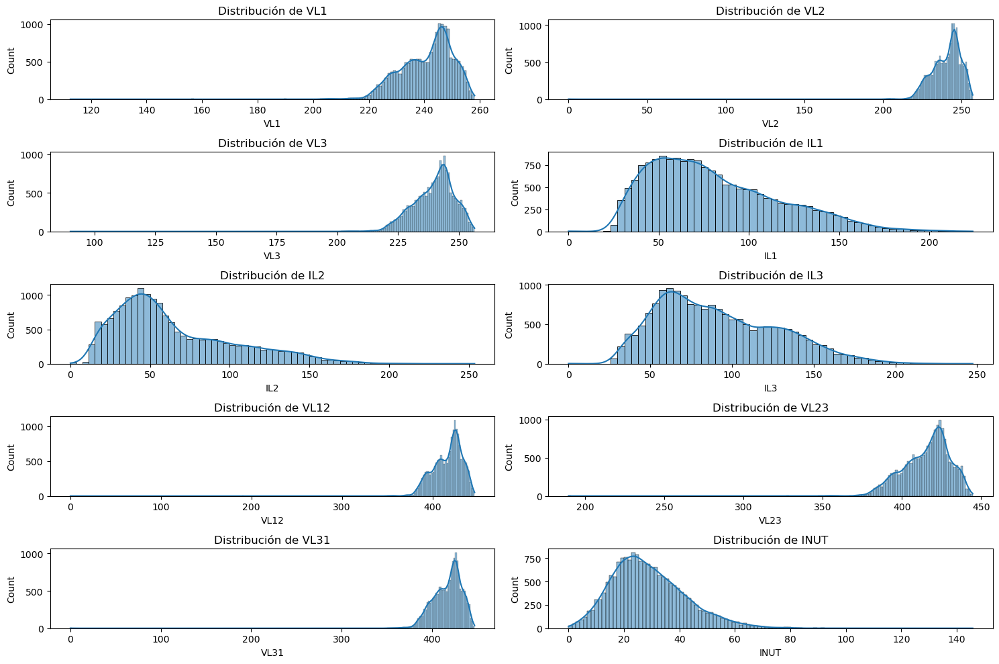

In [18]:
# Configuración de la figura
plt.figure(figsize=(15, 10))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 2, i)
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribución de {col}')

plt.tight_layout()
plt.show()

Una diferencia más que notable, donde han desaparecido el pico del valor 0 para las columnas que previamente lo presentaban.

Continuaremos realizando una matriz de correlación para determinar la relación entre las variables.

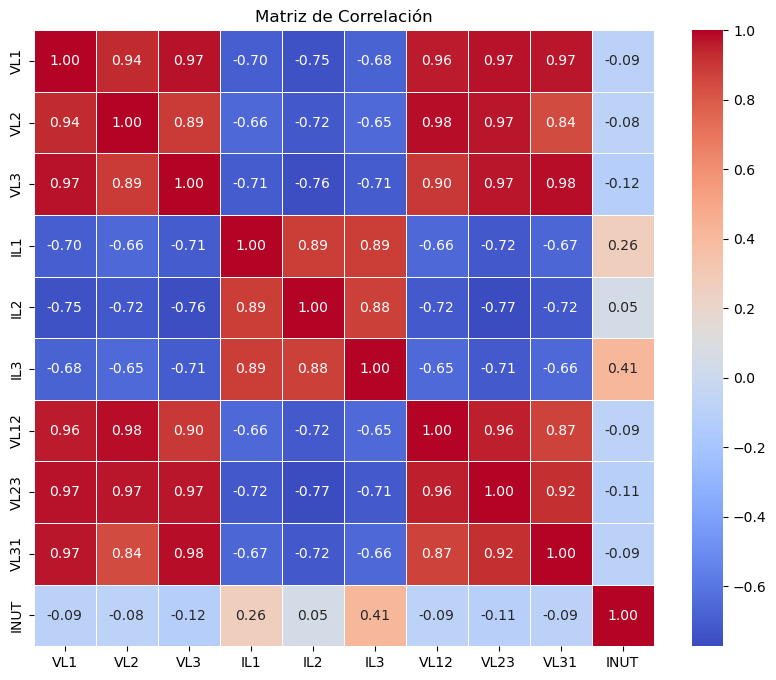

In [19]:
# Calcular la matriz de correlación
correlation_matrix = df[numerical_cols].corr()

# Visualizar la matriz de correlación con un heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()


Analizando la matriz de correlación podemos determinar que tenemos una relación casi de 1-1 entre las tres variables VL que indican el voltaje de las líneas trifásicas de tensión, entre las tres variables de las fases de líneas y entre las fases de líneas	y las lineas trifásicas.

Si realizamos un pairplot para ver la relación entre estas variables es muy probable que veamos una linea diagonal que refleje tan alta relación

<function matplotlib.pyplot.show(close=None, block=None)>

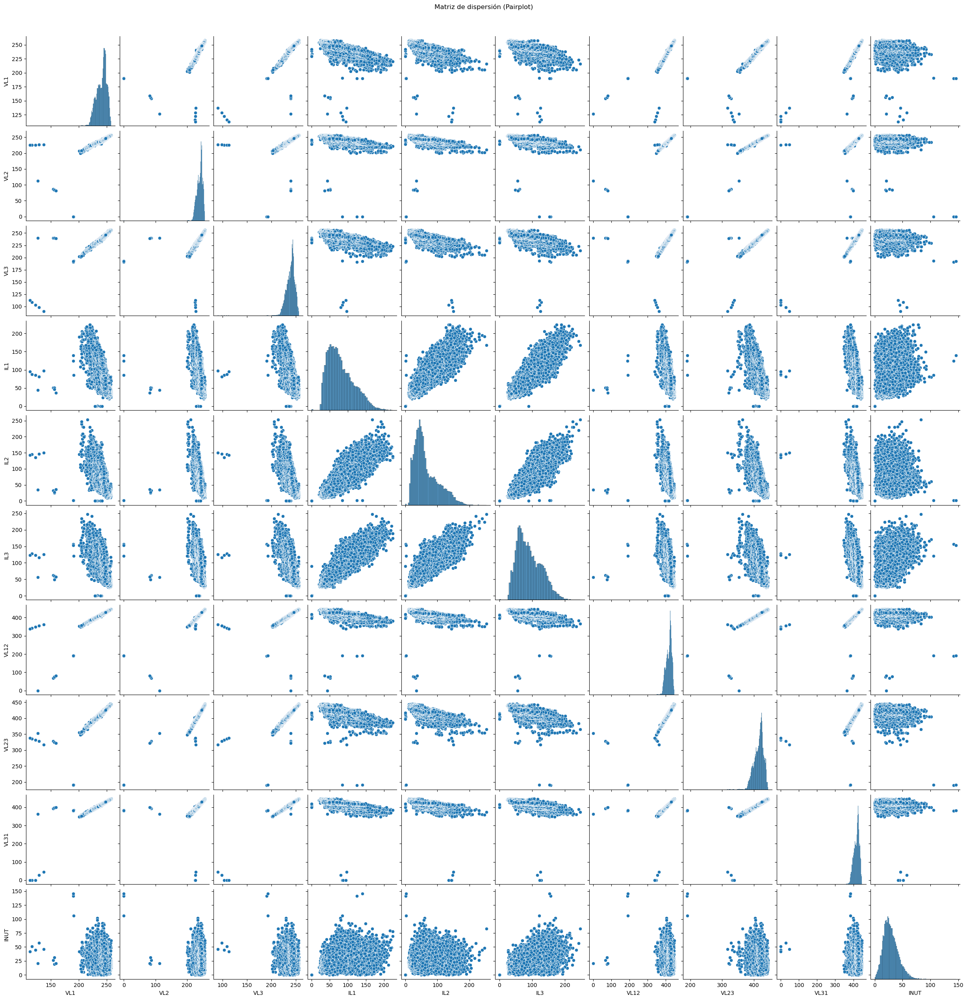

In [20]:
# Generamos un pairplot para ver las relaciones entre todas las variables numéricas
sns.pairplot(df[numerical_cols])
plt.suptitle('Matriz de dispersión (Pairplot)', y=1.02)
plt.show

Y efectivamente, esta relación se mantiene. Sin embargo, hemos optado por no eliminar ninguna columna pues el Dataset no es que tenga una dimensionalidad alta, y como la relación no es del 100%, vamos a seguir trabajando con todos los datos.

Otro de los métodos que suelen utilizarse de forma habitual en la detección de datos anómalos es el rango intercuartílico y los gráficos de caja y bigotes.

In [21]:
# Calculamos el rango intercuartílico (IQR) para cada variable
Q1 = df[numerical_cols].quantile(0.25)
Q3 = df[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

# Identificar outliers
outliers = ((df[numerical_cols] < (Q1 - 1.5 * IQR)) | (df[numerical_cols] > (Q3 + 1.5 * IQR)))

# Contar el número de outliers por variable
outliers_count = outliers.sum()
print("\nNúmero de outliers por variable:")
print(outliers_count)



Número de outliers por variable:
VL1      81
VL2      55
VL3     113
IL1     148
IL2     267
IL3      42
VL12     72
VL23     91
VL31     89
INUT    248
dtype: int64


Donde tras aplicarlo y contar el número de outliers por variable, vemos que tenemos aproximadamente 1200 anomalías en total, siendo INUT y las variables de las líneas la que lideran esta lista. 

Si mostramos estos datos en gráficos, veríamos lo siguiente.

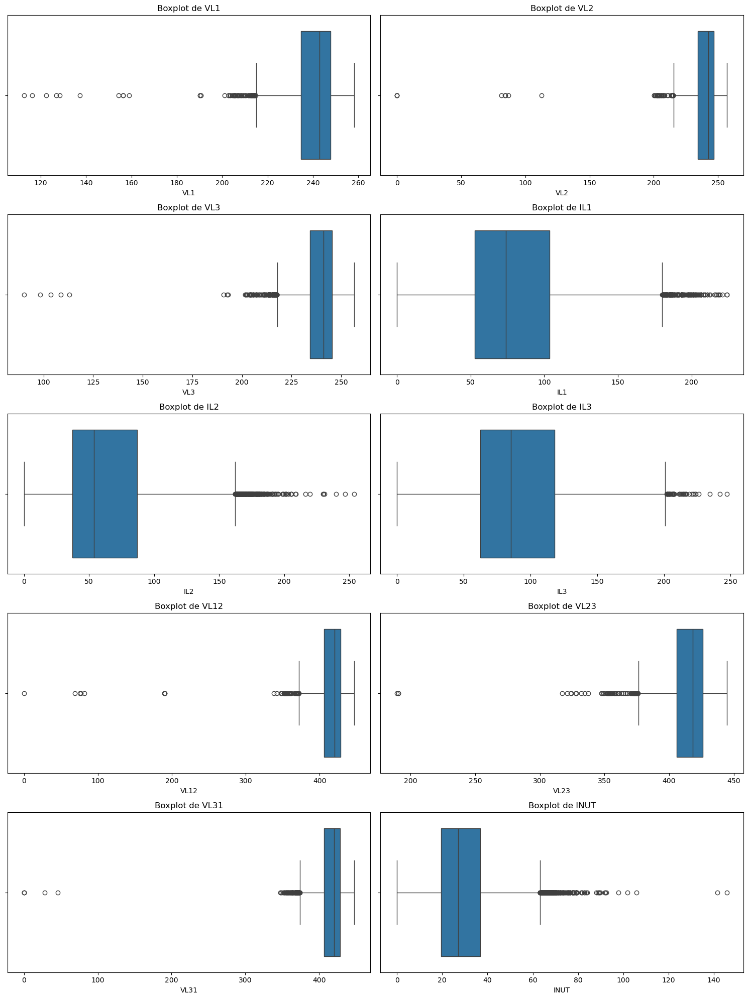

In [22]:
# Crear boxplots para visualizar outliers en cada variable numérica
plt.figure(figsize=(15, 20))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 2, i)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot de {col}')

plt.tight_layout()
plt.show()


Con esta información podriamos determinar lo siguiente para cada conjunto de variables:
- VLX: todos los voltajes inferiores a 220 son datos anómalos.
- ILX: todos los voltajes superiores a 150-200 son anómalos.
- VLXX: todos los voltajes inferioes a 360 son anómalos.
- INUT: todos los voltajes superiores a 60 son anómalos.

Esto coincide con el comportamiento habitual de estas líneas y que se ha comentado previamente. No se van a modificar los datos con esta información pues la idea es utilizar otras formas de detección de anomalías.

Vamos a ver a continuación la evolución de los datos en el tiempo.

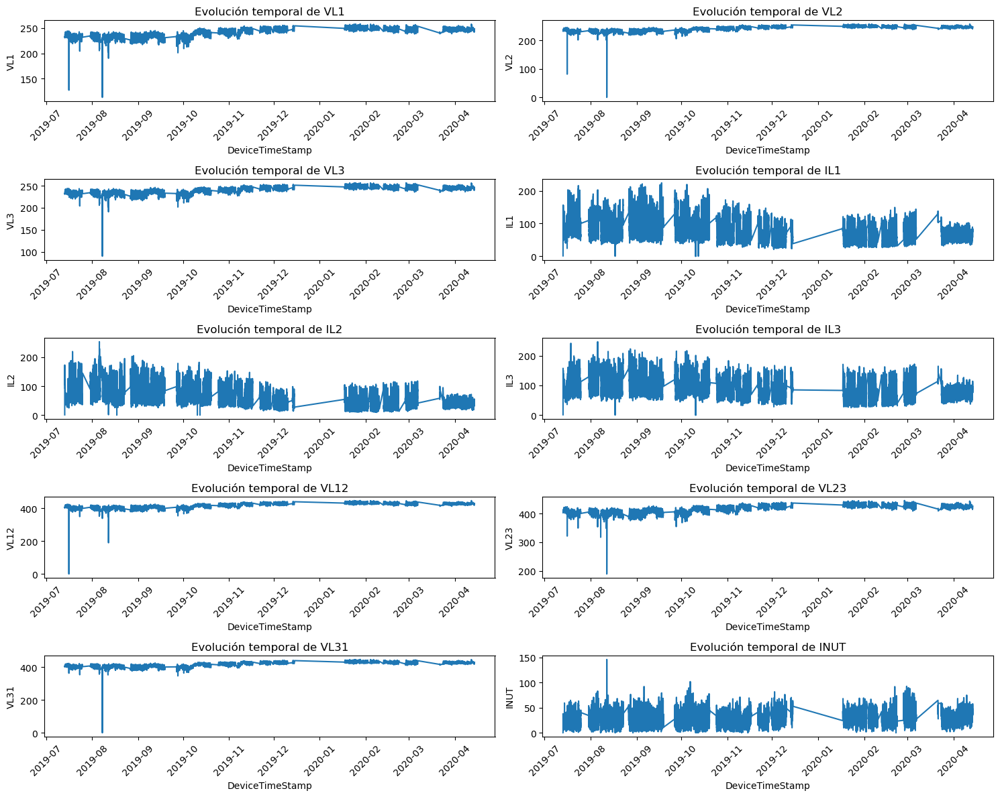

In [23]:
# Creamos un gráfico de la evolución temporal para todas las variables
plt.figure(figsize=(15, 12))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(5, 2, i)
    sns.lineplot(data=df, x='DeviceTimeStamp', y=col)
    plt.title(f'Evolución temporal de {col}')
    plt.xticks(rotation=45)

# Ajustamos los subgráficos para que no se solapen
plt.tight_layout()  
plt.show()


Nos llama la atención dos factores, las caidas de voltajes de ciertos días y la falta de datos en ciertos periodos.

Nos centramos primero en las caidas de voltaje viendo los registros que tienen 0V en alguno de los sensores.

In [24]:
# Filtramos las filas con valores cero en las variables seleccionadas
zero_data = df[(df[['IL1', 'IL2', 'IL3', 'VL12', 'VL23', 'VL31', 'INUT']] == 0).any(axis=1)]

# Mostramos las fechas y las variables con valores cero
zero_dates = zero_data[['DeviceTimeStamp', 'VL1', 'VL2', 'VL3', 'IL1', 'IL2', 'IL3', 'VL12', 'VL23', 'VL31', 'INUT']]
print("Fechas con valores cero en las variables:")
display(zero_dates)


Fechas con valores cero en las variables:


,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
1965,2019-07-16 07:15:00,126.9,112.7,240.0,43.9,34.6,56.2,0.0,352.6,363.4,20.6
3482,2019-08-07 17:45:00,230.9,229.2,231.1,147.6,147.6,148.3,398.7,399.2,402.5,0.0
3486,2019-08-07 18:44:00,122.4,226.3,103.5,85.3,135.0,123.4,347.8,331.9,0.0,44.5
3487,2019-08-07 19:00:00,116.3,225.6,108.7,87.5,145.2,127.8,342.1,334.9,0.0,51.3
3488,2019-08-07 19:15:00,112.6,226.3,112.9,95.0,143.2,122.6,338.1,337.6,0.0,41.8
4414,2019-08-17 11:45:00,231.2,230.4,232.4,0.0,0.0,0.0,396.9,398.8,400.9,0.0
4415,2019-08-17 12:21:00,230.3,229.6,231.6,0.0,0.0,0.0,397.9,399.9,401.7,0.0
4416,2019-08-17 12:30:00,229.3,228.5,230.5,0.0,0.0,0.0,395.6,397.5,399.5,0.0
5197,2019-08-29 12:30:00,225.7,225.0,225.0,128.1,128.1,126.9,390.5,389.8,391.1,0.0
8490,2019-10-10 16:00:00,240.8,239.8,240.2,0.0,0.0,0.0,416.1,415.6,417.6,0.0


En los casos que vemos, notamos que lo que no hay es corriente en las lineas. Algo provocado bien por errores en los sensores o por una no utilización de esas líneas, lo cual, aunque raro, no es imposible. En muchos otros casos vemos que es INUT quien tiene valor 0. Lo que indica un correcto funcionamiento de la red electrica o un fallo en el sensor.

Indagaremos ahora brevemente en estos periodos donde parece que no tenemos información durante varios días, como es el caso de enero 2020.

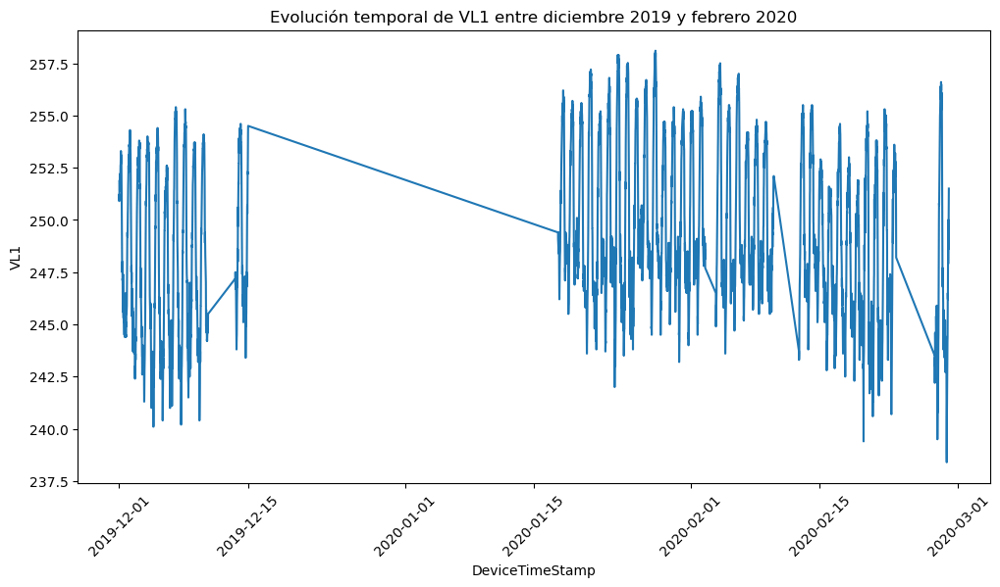


Cantidad de datos por mes (diciembre 2019 - febrero 2020):
DeviceTimeStamp
1     1376
2     1922
12    1067
dtype: int64


In [25]:
# Filtramos los datos entre diciembre de 2019 y febrero de 2020
date_filter = (df['DeviceTimeStamp'] >= '2019-12-01') & (df['DeviceTimeStamp'] <= '2020-02-29')
filtered_data = df[date_filter]

# Contamos la cantidad de registros de la variable 'VL1' en este período
plt.figure(figsize=(12, 6))
sns.lineplot(data=filtered_data, x='DeviceTimeStamp', y='VL1')
plt.title('Evolución temporal de VL1 entre diciembre 2019 y febrero 2020')
plt.xticks(rotation=45)
plt.show()

# Mostrar la cantidad de registros por mes
monthly_data_count = filtered_data.groupby(filtered_data['DeviceTimeStamp'].dt.month).size()
print("\nCantidad de datos por mes (diciembre 2019 - febrero 2020):")
print(monthly_data_count)


Podemos ver un periodo de justo 1 mes desde el 15 de diciembre al 15 de enero en el  que no se han realizado mediciones, y que provoca una disminución considerable del total de registros. Esto puede deberse a que la familia se fuera de vacaciones, pues recordemos que este es un periodo festivo de navidad y es habitual que la gente no esté dentro de su hogar, y por lo tanto no seria necesario ver el consumo de las líneas.

Si nos centramos en ver el número de registros agrupados por diferentes filtros temporales, tenemos lo siguiente:

In [26]:
df['Año'] = df['DeviceTimeStamp'].dt.year.astype(int)
df['Mes'] = df['DeviceTimeStamp'].dt.month.astype(int)
df['Día'] = df['DeviceTimeStamp'].dt.day.astype(int)
df['Hora'] = df['DeviceTimeStamp'].dt.hour.astype(int)
df['Minuto'] = df['DeviceTimeStamp'].dt.minute.astype(int)

In [27]:
(df == 0).groupby(df['Día']).sum()


,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT,Date,Año,Mes,Día,Hora,Minuto
Día,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26,183
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,32,175
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,161
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,186
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31,179
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,25,163
7,0,0,0,0,0,0,0,0,0,3,1,0,0,0,0,26,151
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,157
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,164


In [28]:
(df == 0).groupby(df['Mes']).sum()


,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT,Date,Año,Mes,Día,Hora,Minuto
Mes,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,56,336
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,85,490
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,54,337
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,47,290
7,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,48,286
8,0,0,3,0,3,3,3,0,0,3,5,0,0,0,0,102,603
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,86,508
10,0,0,0,0,4,4,3,0,0,0,5,0,0,0,0,106,614
11,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,93,534


In [29]:
(df == 0).groupby(df['Hora']).sum()

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT,Date,Año,Mes,Día,Hora,Minuto
Hora,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,720,176
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,181
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,178
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,176
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,173
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,177
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,173
7,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,174
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,177


Con todo esto, vamos a proceder a ejecutar los algoritmos de detección de anomalías.

## Media móvil

In [30]:
df_media = df.copy()

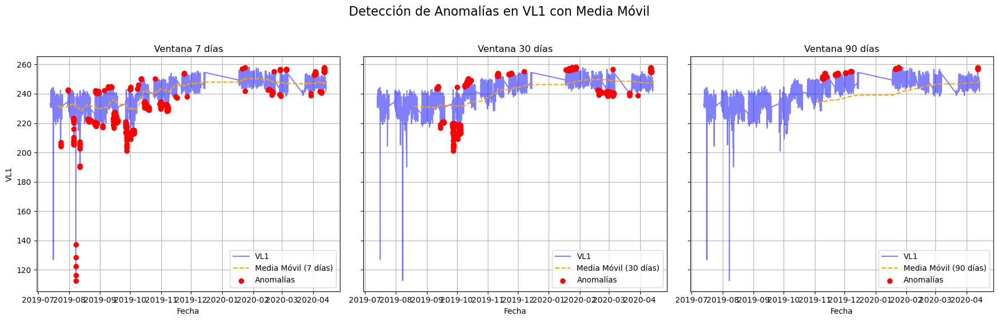

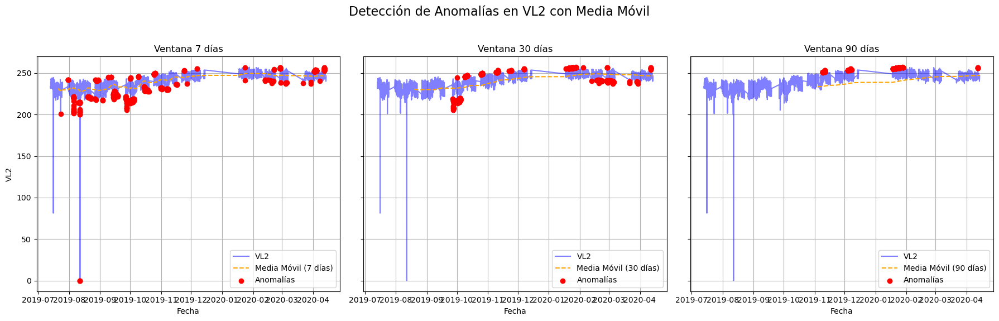

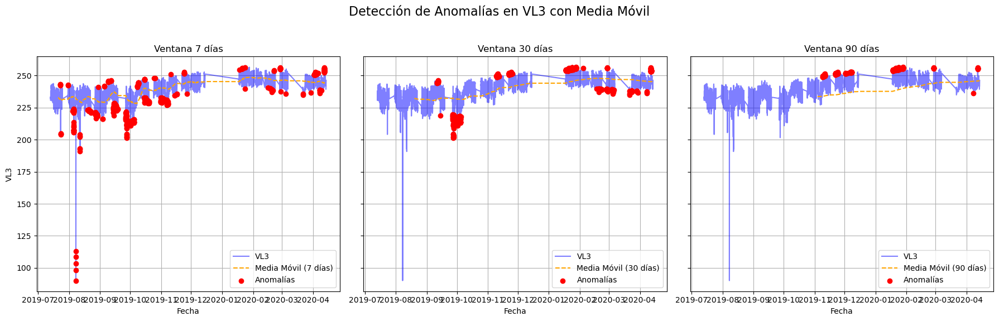

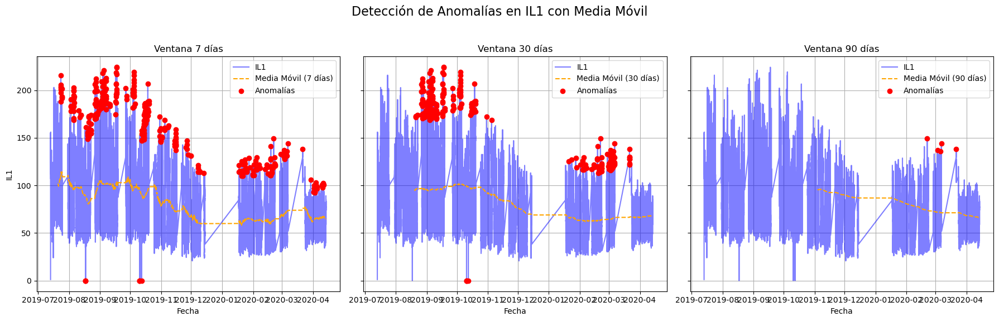

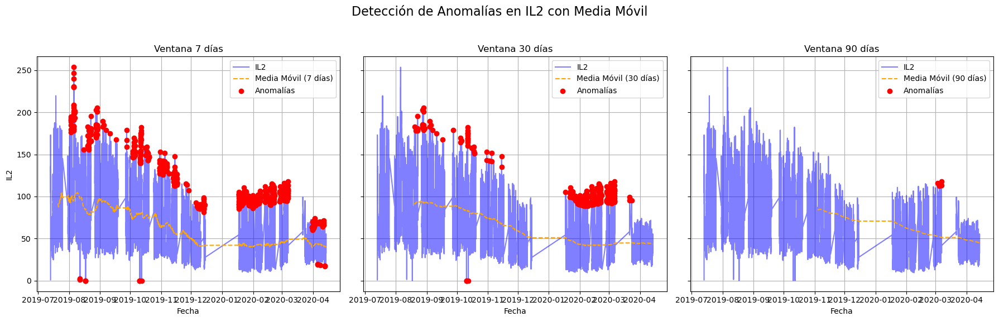

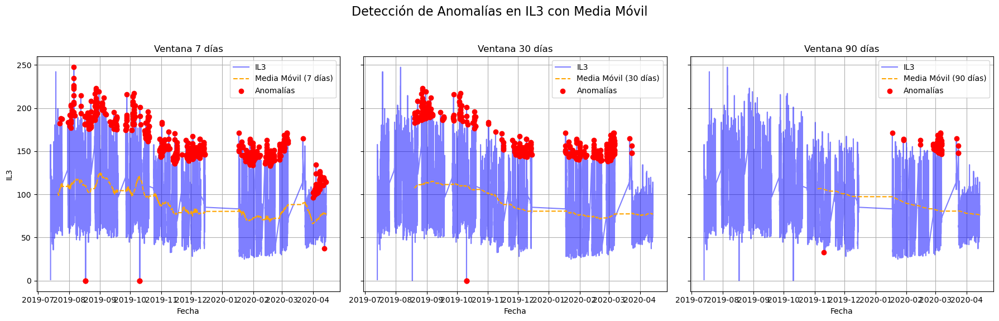

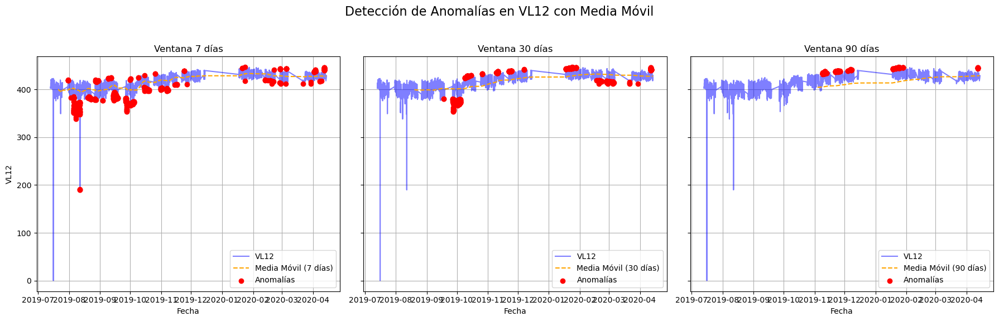

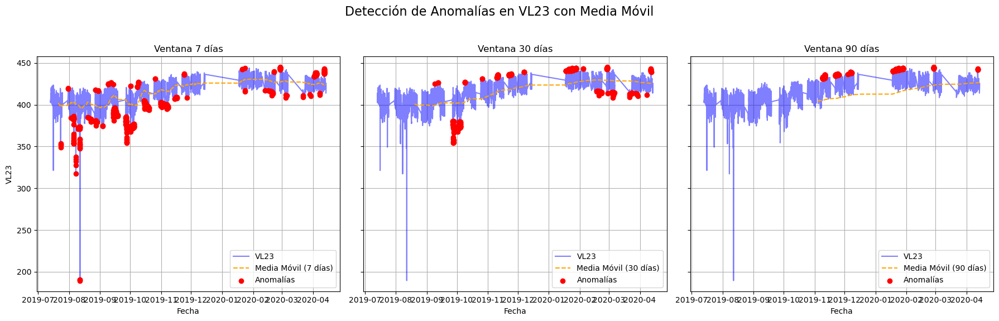

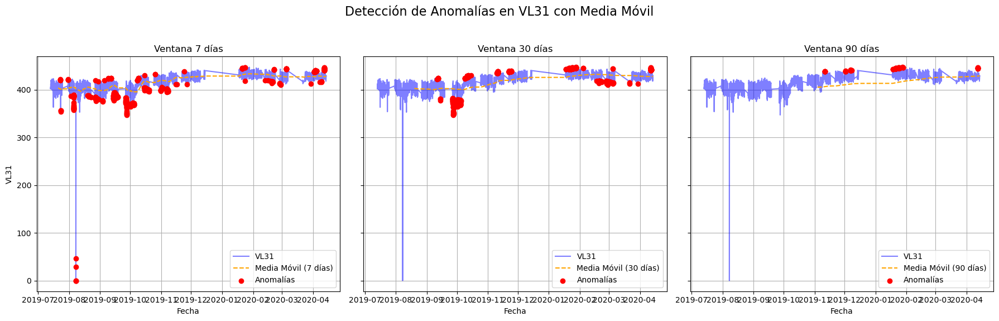

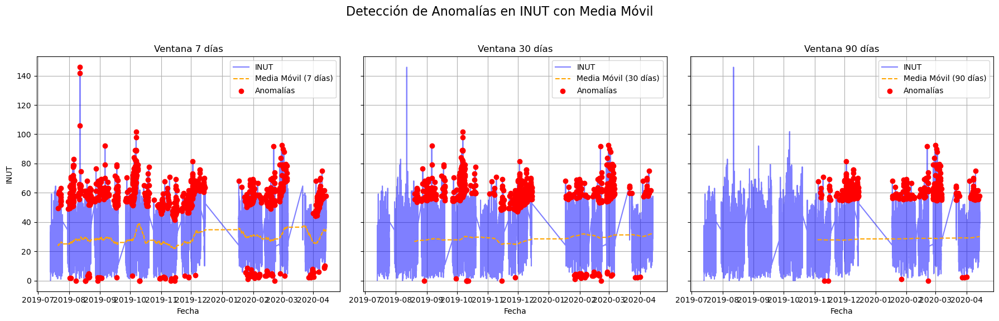

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Nos aseguramos de que 'DeviceTimeStamp' esté en formato datetime
df_media['DeviceTimeStamp'] = pd.to_datetime(df_media['DeviceTimeStamp'])
df_media.set_index('DeviceTimeStamp', inplace=True)

# Configuración de las ventanas en términos de intervalos de 15 minutos
window_7 = 96 * 7    # 7 días
window_30 = 96 * 30  # 30 días
window_90 = 96 * 90  # 90 días
threshold = 2  # Umbral de 2 desviaciones estándar

# Calcular medias móviles, desviaciones estándar y anomalías para cada columna
for column in numerical_cols:
    # Media Móvil y Desviación Estándar para ventana de 7 días
    df_media[f'MA_7_{column}'] = df_media[column].rolling(window=window_7).mean()
    df_media[f'std_7_{column}'] = df_media[column].rolling(window=window_7).std()
    df_media[f'Anomaly_7_{column}'] = (df_media[column] > (df_media[f'MA_7_{column}'] + threshold * df_media[f'std_7_{column}'])) | \
                                      (df_media[column] < (df_media[f'MA_7_{column}'] - threshold * df_media[f'std_7_{column}']))

    # Media Móvil y Desviación Estándar para ventana de 30 días
    df_media[f'MA_30_{column}'] = df_media[column].rolling(window=window_30).mean()
    df_media[f'std_30_{column}'] = df_media[column].rolling(window=window_30).std()
    df_media[f'Anomaly_30_{column}'] = (df_media[column] > (df_media[f'MA_30_{column}'] + threshold * df_media[f'std_30_{column}'])) | \
                                       (df_media[column] < (df_media[f'MA_30_{column}'] - threshold * df_media[f'std_30_{column}']))

    # Media Móvil y Desviación Estándar para ventana de 90 días
    df_media[f'MA_90_{column}'] = df_media[column].rolling(window=window_90).mean()
    df_media[f'std_90_{column}'] = df_media[column].rolling(window=window_90).std()
    df_media[f'Anomaly_90_{column}'] = (df_media[column] > (df_media[f'MA_90_{column}'] + threshold * df_media[f'std_90_{column}'])) | \
                                       (df_media[column] < (df_media[f'MA_90_{column}'] - threshold * df_media[f'std_90_{column}']))



    # Crear subgráficos para cada ventana (7, 30, 90 días)
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)  # 3 subgráficos
    fig.suptitle(f'Detección de Anomalías en {column} con Media Móvil', fontsize=16)

    # Ventana de 7 días
    axs[0].plot(df_media.index, df_media[column], label=column, color='blue', alpha=0.5)
    axs[0].plot(df_media.index, df_media[f'MA_7_{column}'], label='Media Móvil (7 días)', color='orange', linestyle='--')
    axs[0].scatter(df_media.index[df_media[f'Anomaly_7_{column}']], df_media[column][df_media[f'Anomaly_7_{column}']],
                   color='red', label='Anomalías', zorder=5)
    axs[0].set_title('Ventana 7 días')
    axs[0].set_xlabel('Fecha')
    axs[0].set_ylabel(column)
    axs[0].legend()
    axs[0].grid(True)

    # Ventana de 30 días
    axs[1].plot(df_media.index, df_media[column], label=column, color='blue', alpha=0.5)
    axs[1].plot(df_media.index, df_media[f'MA_30_{column}'], label='Media Móvil (30 días)', color='orange', linestyle='--')
    axs[1].scatter(df_media.index[df_media[f'Anomaly_30_{column}']], df_media[column][df_media[f'Anomaly_30_{column}']],
                   color='red', label='Anomalías', zorder=5)
    axs[1].set_title('Ventana 30 días')
    axs[1].set_xlabel('Fecha')
    axs[1].legend()
    axs[1].grid(True)

    # Ventana de 90 días
    axs[2].plot(df_media.index, df_media[column], label=column, color='blue', alpha=0.5)
    axs[2].plot(df_media.index, df_media[f'MA_90_{column}'], label='Media Móvil (90 días)', color='orange', linestyle='--')
    axs[2].scatter(df_media.index[df_media[f'Anomaly_90_{column}']], df_media[column][df_media[f'Anomaly_90_{column}']],
                   color='red', label='Anomalías', zorder=5)
    axs[2].set_title('Ventana 90 días')
    axs[2].set_xlabel('Fecha')
    axs[2].legend()
    axs[2].grid(True)

    # Ajustar el layout y mostrar los gráficos
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Para que no se solapen los títulos
    plt.show()


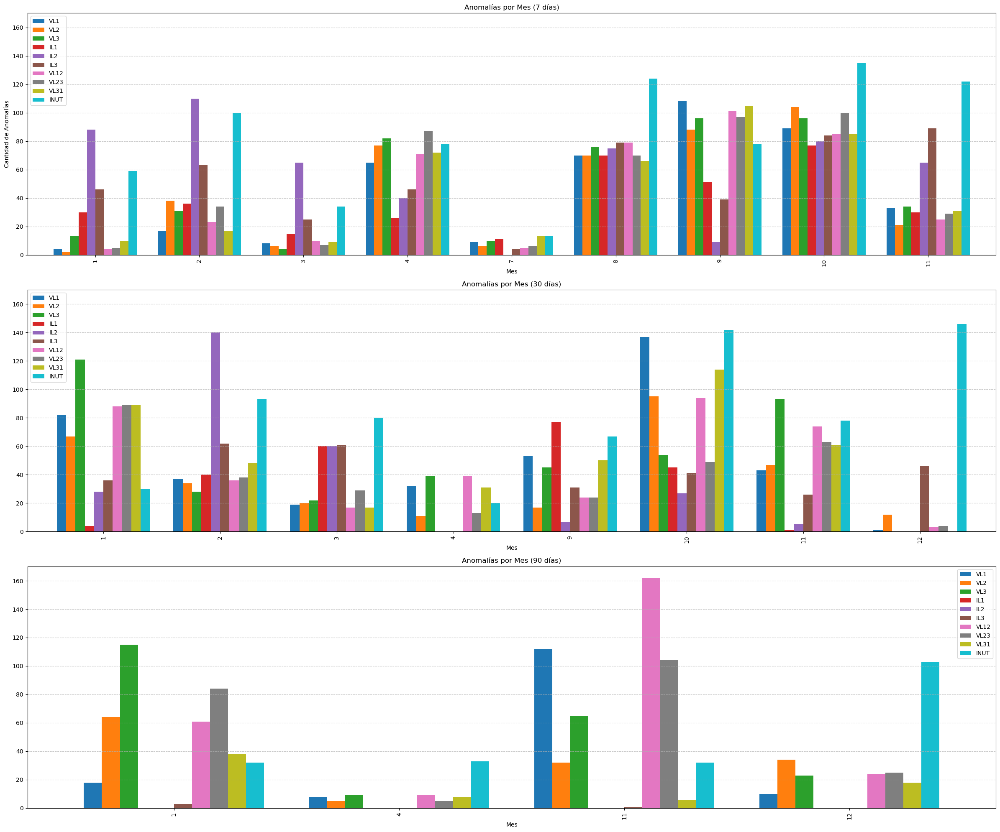

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Agregar una columna de mes para poder agrupar por mes
df_media['Mes'] = df_media.index.month

# Crear un DataFrame vacío para almacenar los resultados
anomaly_counts_7 = pd.DataFrame()
anomaly_counts_30 = pd.DataFrame()
anomaly_counts_90 = pd.DataFrame()

# Iterar sobre cada columna numérica y contar las anomalías por mes para cada ventana (7, 30, 90 días)
for column in numerical_cols:
    anomalies_7 = df_media[df_media[f'Anomaly_7_{column}']].groupby('Mes').size()
    anomalies_30 = df_media[df_media[f'Anomaly_30_{column}']].groupby('Mes').size()
    anomalies_90 = df_media[df_media[f'Anomaly_90_{column}']].groupby('Mes').size()

    # Añadir la columna actual al DataFrame para cada ventana
    anomaly_counts_7[column] = anomalies_7
    anomaly_counts_30[column] = anomalies_30
    anomaly_counts_90[column] = anomalies_90

# Rellenar valores nulos con 0 para cada DataFrame
anomaly_counts_7 = anomaly_counts_7.fillna(0)
anomaly_counts_30 = anomaly_counts_30.fillna(0)
anomaly_counts_90 = anomaly_counts_90.fillna(0)

# Crear los gráficos para cada ventana (7, 30, 90 días)
fig, axes = plt.subplots(3, 1, figsize=(24, 20), sharey=True)

# Gráfico de anomalías para ventana de 7 días
anomaly_counts_7.plot(kind='bar', ax=axes[0], width=0.8)
axes[0].set_title('Anomalías por Mes (7 días)')
axes[0].set_xlabel('Mes')
axes[0].set_ylabel('Cantidad de Anomalías')
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Gráfico de anomalías para ventana de 30 días
anomaly_counts_30.plot(kind='bar', ax=axes[1], width=0.8)
axes[1].set_title('Anomalías por Mes (30 días)')
axes[1].set_xlabel('Mes')
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Gráfico de anomalías para ventana de 90 días
anomaly_counts_90.plot(kind='bar', ax=axes[2], width=0.8)
axes[2].set_title('Anomalías por Mes (90 días)')
axes[2].set_xlabel('Mes')
axes[2].grid(axis='y', linestyle='--', alpha=0.7)

# Ajustar diseño
plt.tight_layout()
plt.show()


### Análisis del Histograma de Anomalías

El histograma muestra la distribución de anomalías detectadas por mes para tres intervalos de media móvil: 7 días, 30 días y 90 días. A continuación, se realiza un análisis considerando tanto los patrones observados como las posibles causas subyacentes.

#### Falta de Datos

En el gráfico no aparecen datos para los meses de mayo y junio, lo que se debe a una ausencia de registros durante este periodo, dado que para Mayo no hay datos y para Junio no hay ningún registro con la columna Input registrada. Esta falta de datos puede haber sido ocasionada por interrupciones en los sensores, problemas de recolección, o periodos de inactividad. Esto tiene un impacto directo en el cálculo de las medias móviles: al reanudarse los datos en julio, el sistema detecta un gran número de anomalías debido a los cambios abruptos en la serie temporal. El salto en los datos de enero y marzo en la representaciones de debe a la falta de datos parcial en estos meses; Por ejemplo: en enero solo hay datos a partir del día 17.

#### Variabilidad en la Detección de Anomalías por Intervalos

El intervalo de 7 días es el más sensible a las fluctuaciones de corto plazo, detectando muchas más anomalías en meses como agosto y octubre. Esto refleja picos abruptos en la serie de datos, especialmente después de interrupciones o eventos de alta variabilidad. El intervalo de 30 días suaviza algo más los datos, pero sigue detectando anomalías significativas en meses como agosto, octubre y diciembre. Por otro lado, el intervalo de 90 días es mucho más conservador y detecta únicamente tendencias o anomalías más persistentes, lo que lo hace menos reactivo a eventos de corta duración.

#### Picos Relevantes en Anomalías

Julio, agosto y noviembre presentan un número relativamente alto de anomalías, especialmente en el intervalo de 7 y 30 días. Esto refuerza la hipótesis del impacto de datos faltantes en meses anteriores, lo que desestabiliza las métricas de las medias móviles al reanudarse la serie. En agosto se observa un gran incremento en las anomalías probablemente debido a ajustes posteriores al periodo sin datos. Octubre y d iciembre y enero también muestran picos significativos en el intervalo de 30 días, lo que podría asociarse con fluctuaciones estacionales, demandas irregulares o eventos operativos.

#### Comparación entre Intervalos

Los tres intervalos muestran distribuciones coherentes, con los valores más altos de anomalías en meses críticos como agosto y diciembre. Sin embargo, el intervalo de 90 días muestra menor sensibilidad, siendo más útil para identificar tendencias generales o anomalías persistentes, mientras que los intervalos de 7 y 30 días permiten detectar eventos abruptos y de mediana duración.



## Z-Score

El Z-score es una medida estadística que indica cuántas desviaciones estándar se encuentra un valor respecto a la media de un conjunto de datos. 

En la detección de anomalías, el Z-score se usa para identificar valores que son significativamente diferentes de la media, donde un Z-score alto (por ejemplo, superior a 3) sugiere que el valor está muy alejado de la media y podría considerarse una anomalía. En el contexto de nuestro dataset, que contiene mediciones de voltajes y corrientes, un Z-score elevado indicaría que una medición particular es inusualmente alta o baja en comparación con las otras mediciones, lo que podría señalar un fallo o un comportamiento anómalo en ese sensor o en el sistema eléctrico en general. Los valores con Z-scores bajos (cercanos a 0) estarían dentro del rango esperado y no se considerarían anomalías.

In [33]:
df_z = df_original.copy()

In [34]:
# Calcular el Z-Score y detectar anomalías
def detectar_anomalias_zscore(df, columnas, umbral=3):
    # Creamos una copia del DataFrame para no modificar los datos originales
    df_anomalias = df.copy()
    
    # Iteramos sobre las columnas especificadas para detectar anomalías
    for columna in columnas:
        # Calculamos la media de la columna
        media = df[columna].mean()
        # Calculamos la desviación estándar de la columna
        desviacion = df[columna].std()
        
        # Calculamos el Z-score para cada valor de la columna y verificamos si es mayor que el umbral
        # Si el Z-score absoluto es mayor que el umbral, lo consideramos una anomalía
        df_anomalias[f'{columna}_anomaly'] = ((df[columna] - media) / desviacion).abs() > umbral
    
    # Devolvemos el DataFrame con las columnas originales y las nuevas columnas de anomalías
    return df_anomalias  # Nueva Dataset con columna analizada.


In [35]:
# Ejecutamos la detección de anomalías
df_anomalias = detectar_anomalias_zscore(df_z, numerical_cols)

# Mostramos
for columna in numerical_cols:
    num_anomalias = df_anomalias[f'{columna}_anomaly'].sum()
    print(f"Columna {columna}: {num_anomalias} anomalías detectadas.")

# Guardar el dataset con las marcas de anomalías (optional)
#df_anomalias.to_csv('CurrentVoltage_with_anomalies.csv', index=False)
#print("\nDataset con anomalías guardado en: CurrentVoltage_with_anomalies.csv")


Columna VL1: 58 anomalías detectadas.
Columna VL2: 39 anomalías detectadas.
Columna VL3: 64 anomalías detectadas.
Columna IL1: 84 anomalías detectadas.
Columna IL2: 91 anomalías detectadas.
Columna IL3: 42 anomalías detectadas.
Columna VL12: 43 anomalías detectadas.
Columna VL23: 50 anomalías detectadas.
Columna VL31: 44 anomalías detectadas.
Columna INUT: 111 anomalías detectadas.


Los resultados del Z-score muestran el número de anomalías detectadas en cada columna del dataset:

- Voltajes (VL1, VL2, VL3): Presentan un número moderado de anomalías (39-64), indicando algunas fluctuaciones atípicas, pero dentro de un rango razonable.
- Corrientes (IL1, IL2, IL3): Tienen más anomalías (42-91), especialmente IL2, lo que sugiere más variabilidad o posibles problemas en los sensores de corriente.
- Tensión entre fases (VL12, VL23, VL31): También muestran anomalías (43-50), aunque menos pronunciadas que las de corriente.
- Corriente neutra (INUT): Tiene el mayor número de anomalías (111), lo que podría indicar problemas o desequilibrios más significativos en el sistema.

Este análisis sugiere que las corrientes y la corriente neutra presentan más fluctuaciones atípicas que los voltajes, por lo que vamos a analizar las primeras 20 filas:

In [36]:
# Vemos las primeras 20 filas con anomalías (Ejemplo VL1) 
display(df_anomalias[df_anomalias['VL1_anomaly']].head(20))

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,...,VL1_anomaly,VL2_anomaly,VL3_anomaly,IL1_anomaly,IL2_anomaly,IL3_anomaly,VL12_anomaly,VL23_anomaly,VL31_anomaly,INUT_anomaly
1961,2019-07-16 06:20:00,154.4,86.9,240.1,50.7,32.1,62.2,68.6,328.2,393.2,...,True,True,False,False,False,False,True,True,False,False
1962,2019-07-16 06:30:00,156.4,84.3,239.6,51.2,24.7,59.6,76.9,324.1,397.8,...,True,True,False,False,False,False,True,True,False,False
1963,2019-07-16 06:45:00,156.4,83.9,239.7,46.0,28.1,48.8,75.5,323.7,396.4,...,True,True,False,False,False,False,True,True,False,False
1964,2019-07-16 07:00:00,159.0,81.3,239.5,36.4,36.0,57.1,81.5,321.3,399.6,...,True,True,False,False,False,False,True,True,False,False
1965,2019-07-16 07:15:00,126.9,112.7,240.0,43.9,34.6,56.2,0.0,352.6,363.4,...,True,True,False,False,False,False,True,True,True,False
2612,2019-07-23 13:57:00,204.3,201.1,204.1,178.9,180.5,141.6,349.2,349.2,354.1,...,True,True,True,False,True,False,True,True,True,False
2613,2019-07-23 14:00:00,206.7,204.6,204.5,197.6,172.8,142.9,356.5,353.3,356.2,...,True,True,True,True,False,False,True,True,True,False
2614,2019-07-23 14:15:00,205.3,202.5,204.3,167.5,139.4,146.1,354.1,351.9,357.0,...,True,True,True,False,False,False,True,True,True,False
2615,2019-07-23 14:30:00,205.5,202.8,205.0,205.7,160.3,137.1,353.5,352.2,356.2,...,True,True,True,True,False,False,True,True,True,False
3387,2019-08-05 17:20:00,206.8,202.0,207.4,160.7,208.4,156.1,351.3,353.3,360.6,...,True,True,True,False,True,False,True,True,True,False


Con esta nueva información, podemos detallar más la información para cada grupo:

- Voltajes (VL1, VL2, VL3): Las primeras filas muestran anomalías en VL1, VL2, y VL3, lo cual puede estar indicando fluctuaciones inusuales o fallos en esos sensores. Sin embargo, no todas las columnas presentan anomalías al mismo tiempo.
- Corrientes (IL1, IL2, IL3): En IL2 y IL3, las anomalías están menos distribuidas, lo que podría señalar un comportamiento más normal para esas columnas en comparación con las de voltaje.
- Tensiones entre fases (VL12, VL23, VL31): En estas columnas se observan algunas anomalías, pero generalmente son menos frecuentes que en las columnas de voltaje o corriente.
- Corriente neutra (INUT): La columna INUT presenta anomalías esporádicas, lo que puede reflejar problemas en el sistema de distribución o en la medición de la corriente neutra.


A continuación trataremos de calcular los datos anómalños a traves de la desviación estandar, usando como umbral 3 veces el valor de la desviacion estandar.

In [37]:
# El umbral en desviaciones estándar
umbral = 3

# Función para detectar anomalías basadas en desviaciones estándar
def detectar_anomalias_std(df, columnas, umbral):

    df_anomalias = df.copy()
    for columna in columnas:
        media = df[columna].mean()
        desviacion = df[columna].std()
        # Identificamos las anomalías
        df_anomalias[f'{columna}_anomaly'] = ((df[columna] < (media - umbral * desviacion)) |
                                              (df[columna] > (media + umbral * desviacion)))
    return df_anomalias # Dataset con una nueva columna para cada columna analizada, indicando si es una anomalía.



In [38]:
# Aplicar la detección de anomalías
df_anomalias_std = detectar_anomalias_std(df_z, numerical_cols, umbral)

# Mostrar
for columna in numerical_cols:
    num_anomalias = df_anomalias_std[f'{columna}_anomaly'].sum()
    print(f"Columna {columna}: {num_anomalias} anomalías detectadas con el umbral de {umbral} desviaciones estándar.")

# Guardar el dataset con anomalías detectadas (optional)
#df_anomalias_std.to_csv('CurrentVoltage_anomalies_std.csv', index=False)
#print("\nDataset con anomalías detectadas guardado en: CurrentVoltage_anomalies_std.csv")


Columna VL1: 58 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna VL2: 39 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna VL3: 64 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna IL1: 84 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna IL2: 91 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna IL3: 42 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna VL12: 43 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna VL23: 50 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna VL31: 44 anomalías detectadas con el umbral de 3 desviaciones estándar.
Columna INUT: 111 anomalías detectadas con el umbral de 3 desviaciones estándar.


El resultado de aplicar 3 desviaciones estandar es el mismo que el de aplicar Z-score, y es que ambas funciones, aunque implementadas de manera diferente, aplican el mismo criterio de desviación estándar para detectar anomalías. La diferencia es más conceptual que funcional, ya que ambas se basan en un umbral de desviación estándar para definir lo que es "anómalo". Por lo tanto, los resultados coinciden porque el cálculo subyacente es esencialmente el mismo. 

Veamos ahora como se traslada este procedimiento a una forma más visutal.

In [39]:
# Función para visualizar las anomalías de todas las columnas
def visualizar_anomalias_todas(df, columnas, umbral=3):
    
    for columna in columnas:
        media = df[columna].mean()
        desviacion = df[columna].std()

        # Rango de valores normales
        limite_inferior = media - umbral * desviacion
        limite_superior = media + umbral * desviacion

        # Crear el gráfico
        plt.figure(figsize=(12, 6))
        plt.plot(df[columna], label='Datos', color='blue', alpha=0.7)
        plt.axhline(media, color='green', linestyle='--', label='Media')
        plt.axhline(limite_inferior, color='red', linestyle='--', label=f'-{umbral}σ')
        plt.axhline(limite_superior, color='red', linestyle='--', label=f'+{umbral}σ')

        # Destacar anomalías
        anomalías = df[(df[columna] < limite_inferior) | (df[columna] > limite_superior)]
        plt.scatter(anomalías.index, anomalías[columna], color='red', label='Anomalías', zorder=5)

        plt.title(f'Anomalías detectadas en {columna} (Umbral: {umbral}σ)')
        plt.xlabel('Índice')
        plt.ylabel(columna)
        plt.legend()
        plt.grid()
        plt.show()

Para cada columna aplicamos el metodo de Z-Score con la desviación estandar para determinar los datos anómalos, que se han coloreado de rojo y que estan fuiera de 3 veces el rango de la desviación estandar.

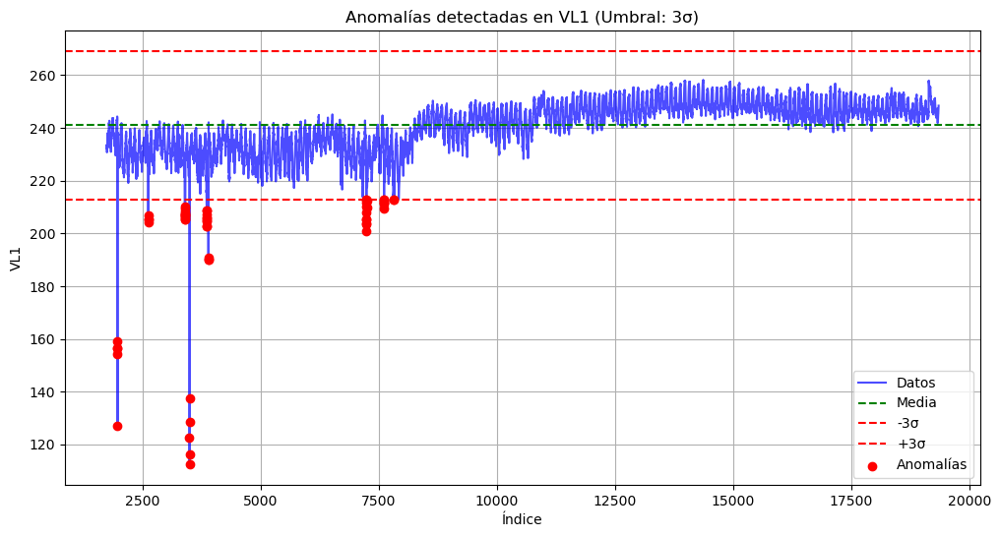

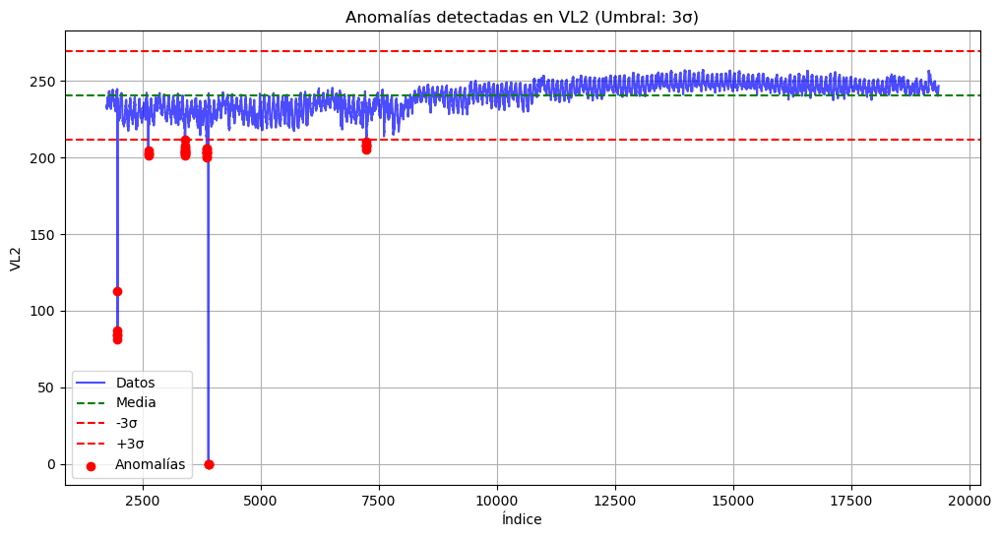

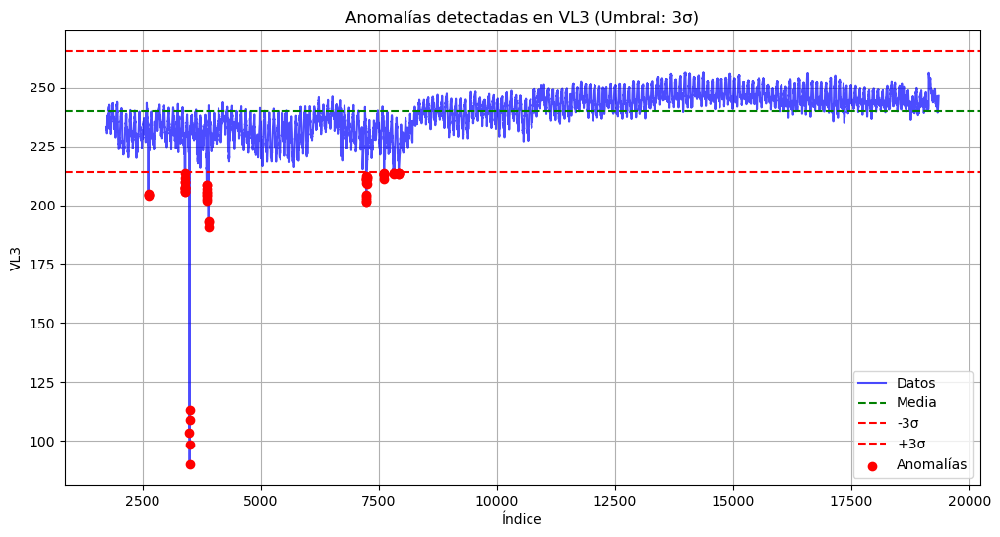

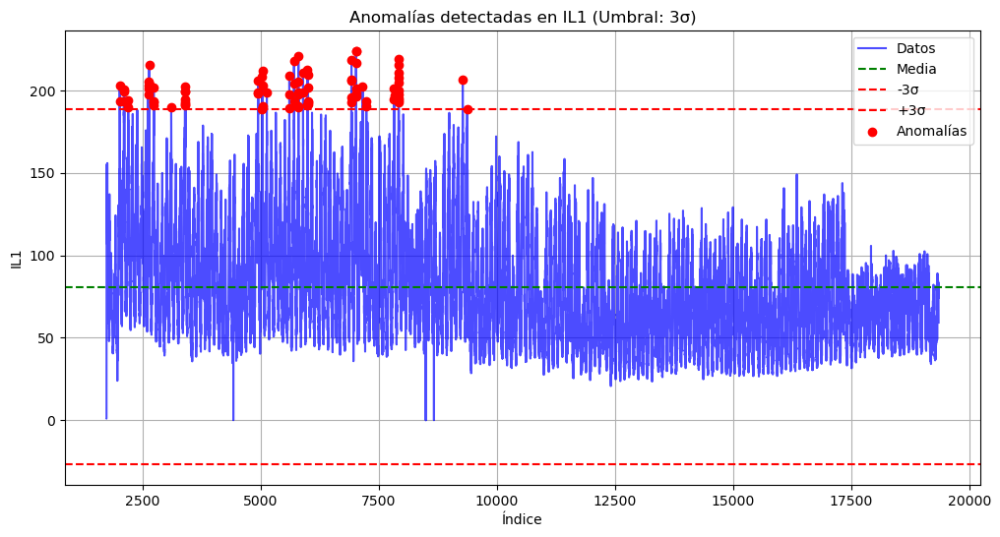

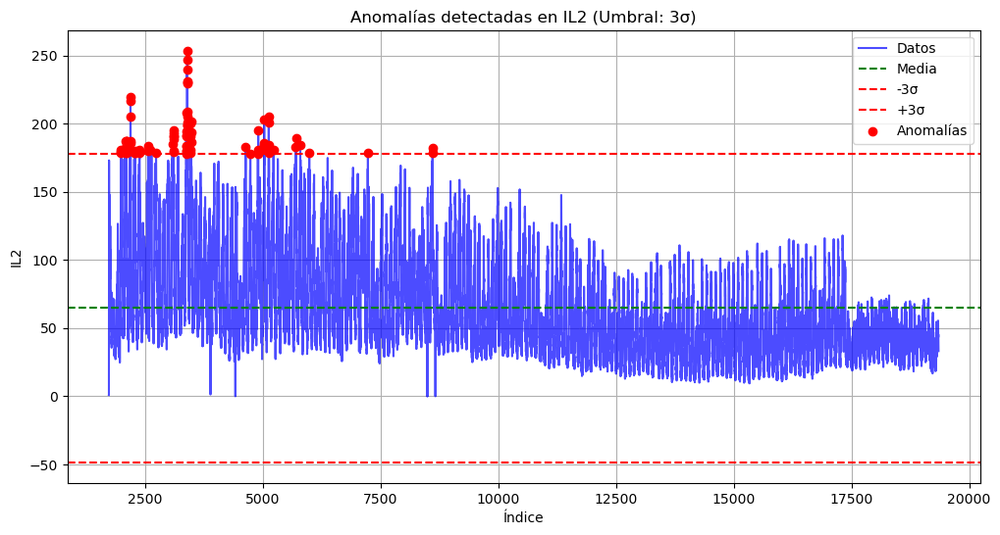

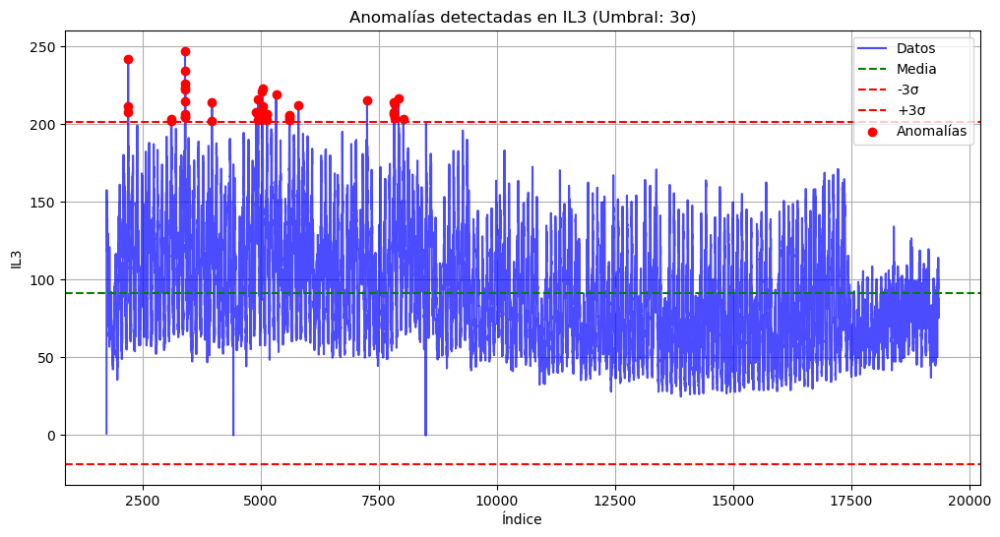

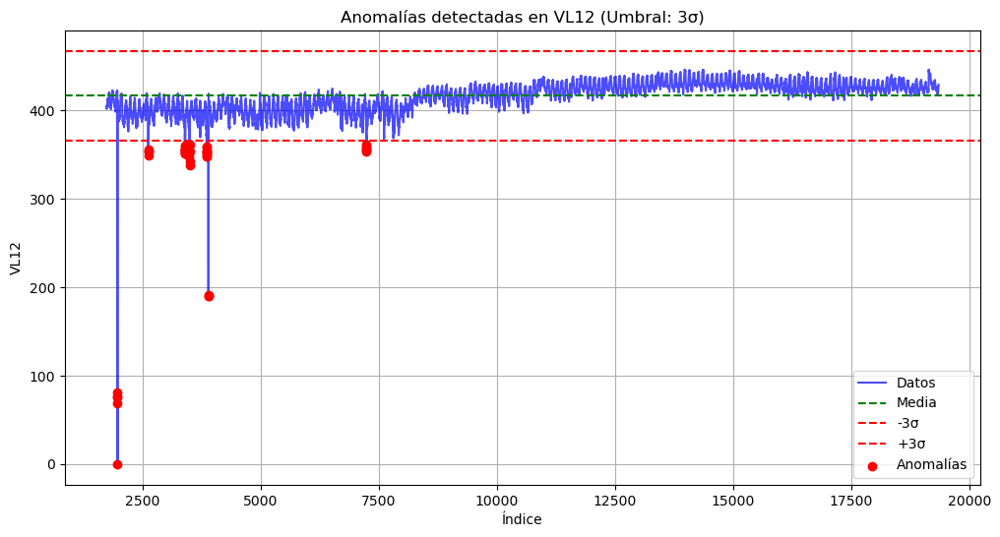

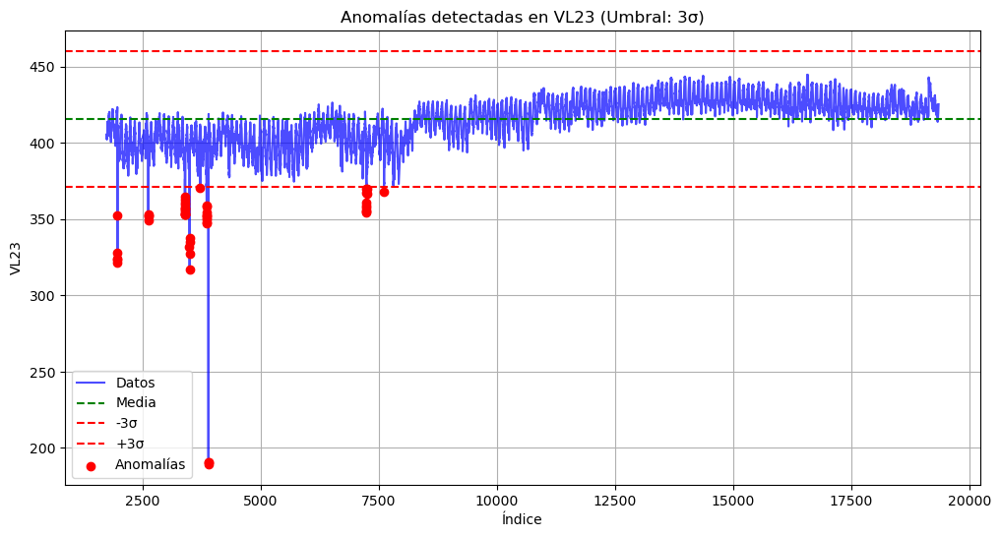

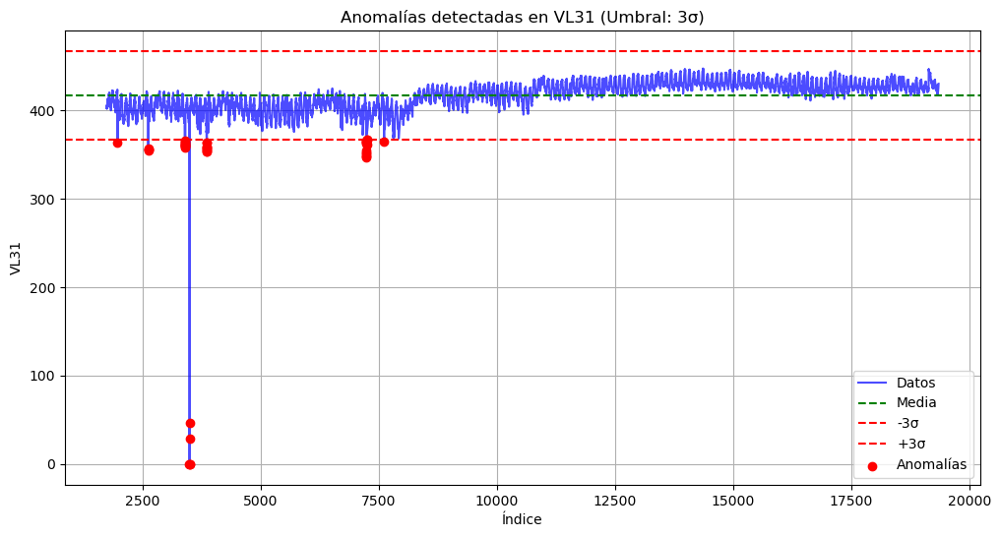

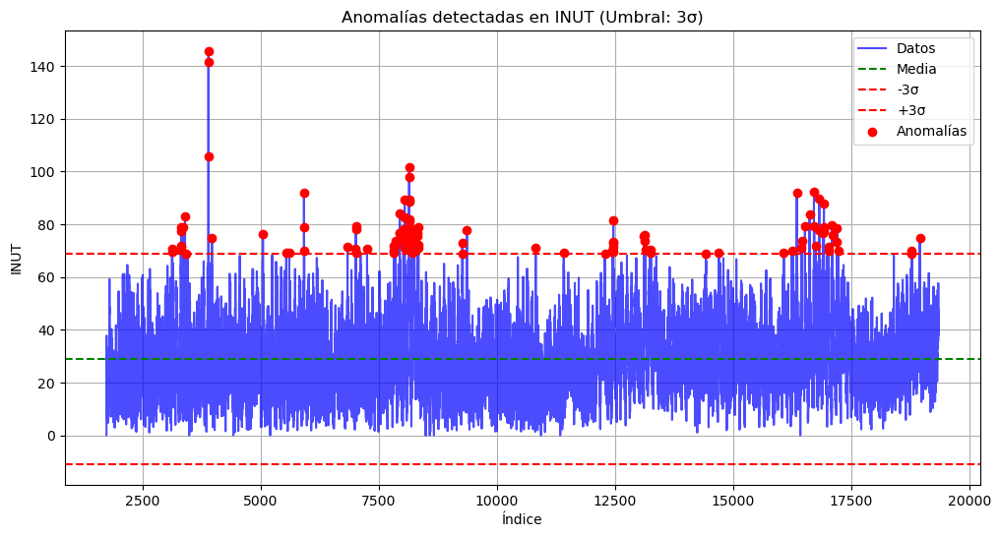

In [40]:
# Visualizar anomalías
visualizar_anomalias_todas(df_z, numerical_cols, umbral=3)

Gracias a esta visualización podemos examinar más en profundidad los datos:

- Voltajes (VL1, VL2, VL3): La media de estos sensores se sitúa en torno a los 240-250V, por lo que se han determinado que todos los voltajes inferiores a los 220V aproximadamente son datos anómalos. Si comparamos las gráficas de los tres sensores tambien podemos ver que hay ligeros paralelismos, y es que hay fechas concretas en las que los tres sensores han sufrido una caida de tensión. 
- Corrientes (IL1, IL2, IL3): Estas lineas tienen una variación más alta, lo que situa el rango de la desviación estandar únicamente con un límite superior, haciendo que cuando los sensores detectan 0 se trate como dato normal. En todos ellos vemos que las anomalías se detectan a partir de unos 170-200V aproximadamente, habiendo sufrido estas anomalías únicamente durante las primeras fechas desde la instalación de los sensores, normalizando más la corriente de estas lineas conforme pasan los meses.
- Tensiones entre fases (VL12, VL23, VL31): De forma similar a los voltajes de VLX, la media de estos tres sensores ronda los 400V y se ha considerado anomalía todo aquello que baje de los 380V aproximadamente. Sufriendo estas caidas únicamente durante los primeros meses.
- Corriente neutra (INUT): Es la que más anomalías tiene a lo largo del tiempo y que todo voltaje superior a los 70V es una anomalía. Esto corrobora que su comportamiento esperado es un voltaje cercano a cero, pues cualquier otra cosa indica que hay una derivación de electricidad a esta línea. Es la única que tiene anomalías durante todo el periodo.

En todas las gráficas parece que hay ciertas fechas en las que en todas las columnas se detectan anomalías, por lo que podríamos revisar todos los momentosn en los que se han detectado estas anomalías y analizar la causa de esto. Además, podriamos incluso decir que durante este experimento la instalación eléctrica de la casa se revisó, pues dejaron de producirse caidas o subidas de tensión.
Esta forma de detectar anomalias y representarlas de forma visual ayuda mucho a entender el funcionamiento normal de los sensores y distinguir de una forma sencilla estos datos anómalos.

## Isolation Forest

l algoritmo de Isolation Forest es una técnica útil para la detección de anomalías, especialmente en datasets grandes con múltiples dimensiones y se basa en la idea de que los valores atípicos son más fáciles de aislar que los valores normales. Para ello, construye múltiples árboles binarios (bosque) de forma recursiva, dividiendo aleatoriamente las características y seleccionando umbrales hasta que los puntos son completamente aislados. Cuanto más rápido se aísla un punto, mayor es la probabilidad de que sea una anomalía. La "profundidad de aislamiento" se utiliza para medir cuán atípico es un punto: los puntos con menor profundidad de aislamiento se consideran más anómalos.

Tenemos dos formas de aplicarlo a nuestro conjunto de datos, de forma global o columna a columna, lo que tiene sus ventajas e inconvenientes:

#### Aplicar Isolation Forest a todo el conjunto de datos:
Cuando se aplica Isolation Forest a todo el conjunto de datos (es decir, a todas las columnas simultáneamente), el modelo busca anomalías teniendo en cuenta todas las características juntas. Este enfoque es más apropiado cuando se espera que las anomalías no sean fácilmente detectables a nivel univariante, sino que es más problable que surjan de combinaciones complejas de características. En este caso, el modelo tratará de aprender las relaciones multivariantes entre las columnas y clasificará los puntos anómalos en función de su comportamiento global en el espacio de características.

##### Ventajas:
- **Captura las relaciones multivariantes**: Si las anomalías dependen de combinaciones complejas de variables, este enfoque es el más adecuado, ya que tiene en cuenta todas las características al mismo tiempo.
- **Más eficaz en datasets multivariantes**: Los modelos multivariantes como Isolation Forest tienen la capacidad de aprender y detectar patrones complejos que no se pueden capturar simplemente observando una columna individual.
##### Desventajas:
- **Puede ser más sensible a los valores atípicos en variables muy dispersas**: Si alguna columna tiene una escala muy diferente de las demás (por ejemplo, un rango mucho más grande o más pequeño), esto podría influir en los resultados. Asegúrate de que las columnas estén normalizadas o estandarizadas si es necesario.
- **No ofrece visibilidad sobre anomalías por columna**: Si quieres entender qué características están impulsando la detección de anomalías, este enfoque te dará una predicción global pero no te proporcionará detalles por cada variable individualmente.

#### Aplicar Isolation Forest columna por columna:
Cuando se aplica Isolation Forest columna por columna, se entrena un modelo independiente para cada característica para detectar las anomalías en cada variable de manera univariante. Este enfoque es útil si se cree que las anomalías en cada columna se pueden detectar por separado o si cada variable tiene una distribución lo suficientemente distinta para que el modelo funcione bien por sí sola.

##### Ventajas:
- **Más fácil de interpretar**: Si lo que se pretende es identificar anomalías en una sola característica a la vez (por ejemplo, un pico en el voltaje de una fase o una caída en la corriente), este enfoque proporciona una forma más directa de analizar los datos y obtener una visión más clara de los problemas en una sola variable.
- **Menos riesgo de ser influenciado por las relaciones entre variables**: Este enfoque es útil cuando no se espera que las anomalías dependan de combinaciones complejas de características, sino de valores atípicos en cada columna por separado.
##### Desventajas:
- **No captura interacciones entre variables**: Si las anomalías dependen de la interacción entre dos o más variables, este enfoque puede no ser tan eficaz. La detección de anomalías puede ser menos precisa en datos multivariantes.
- **Menos robusto si las anomalías son complejas**: Si las anomalías en los datos están relacionadas con combinaciones de variables, aplicar el modelo por separado para cada columna podría no ser suficiente.


#### ¿Cuál elegir?
Si las anomalías en los datos son causadas por combinaciones complejas de características (por ejemplo, un cambio en el voltaje de varias fases a la vez), entonces es mejor aplicar Isolation Forest a todo el conjunto de datos.

Si las anomalías son causadas por valores atípicos en columnas individuales (por ejemplo, un pico de voltaje en una fase específica), aplicar Isolation Forest columna por columna puede ser una opción más sencilla y directa.

#### Consideraciones adicionales:
**Escalado de características**: Si se aplica Isolation Forest a todo el conjunto de datos y las características tienen escalas muy diferentes es recomendable normalizar o estandarizar las características para que el modelo no esté influenciado por esas diferencias.

**Modelo híbrido**: También se pueden combinar ambos enfoques, aplicando primero Isolation Forest a todo el conjunto de datos y luego examinar las anomalías de las columnas individuales para obtener más información sobre qué variables contribuyen a la anomalía.


### Isolation Forest a todo el conjunto de datos

Lo que vamos a hacer es crear una función que nos permita aplicar Isolation Forest a las columnas deseadas de un DF variando el nivel del hiperparámetro 'Contamination'. 
Guardaremos las puntuaciones generadas por el modelo para poder distinguir si es una variable anómala o no, recordando que son las puntuaciones negativas las que indican que nos encontramos ante un dato anómalo.

Con esta información, mostraremos las puntuaciones de anomalía de cada columna visualizando el umbral, posteriomente compararemos el número de datos normales vs anómalos y finalmente, visualizaremos los datos anómalos an base a los datos de la columna INUT, pues como hemos visto previamente, si hay un error en la red, es muy probable que el voltaje de la linea neurtra sea distinto de 0.

In [41]:
from sklearn.ensemble import IsolationForest

# Funciópn que aplica Isolation Forest a las columnas numéricas y gurada las puntuaciones de anomalía y las etiquetas en el DF
def apply_isolation_forest_global(df, cols=numerical_cols, contamination_value=0.05):

    # Aplicamos Isolation Forest a todas las columnas seleccionadas
    isolation_forest = IsolationForest(contamination=contamination_value, random_state=42)

    # Entrenamos el modelo utilizando todas las columnas
    isolation_forest.fit(df[cols])
    
    # Obtenemos las puntuaciones de anomalía para todo el conjunto de datos
    anomaly_scores = isolation_forest.decision_function(df[cols])
    
    # Guardamos las puntuaciones de anomalía en el DataFrame
    df[f'Anomaly_Score_Global_{contamination_value}'] = anomaly_scores
    
    # sacamos la etiqueta de la puntuación
    anomalies = isolation_forest.predict(df[cols])
    
    # Convertimos las etiquetas a formato binario (0 = normal, 1 = anómalo)
    df[f'Anomaly_Global_{contamination_value}'] = anomalies
    df[f'Anomaly_Global_{contamination_value}'] = df[f'Anomaly_Global_{contamination_value}'].map({1: 0, -1: 1}) 
    
    return df

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

# Función que muestra los gráficos de anomalías y la distribución de las etiquetas de anomalía.
def show_anomaly_graphs_global(df, cols=numerical_cols, contamination_value=0.05):

    # Creamos figura para visualizar todos los gráficos de anomalías de las columnas
    fig, axs = plt.subplots(5, 2, figsize=(20, 15), facecolor='w', edgecolor='k')
    axs = axs.ravel()

    for i, column in enumerate(cols):
        # Usamos el sufijo '_global' para distinguir las columnas
        anomaly_score_column = f'Anomaly_Score_Global_{contamination_value}'
        anomaly_label_column = f'Anomaly_Global_{contamination_value}'

        # Verificamos si la columna de puntuación existe para evitar errores
        if anomaly_score_column not in df.columns:
            print(f"Columna {anomaly_score_column} no encontrada.")
            continue  # Si no se encuentra la columna, saltar a la siguiente

        # Obtener las puntuaciones de anomalía y las etiquetas
        anomaly_score = df[anomaly_score_column]
        outliers = df[anomaly_label_column]
        
        # Visualizar puntajes de anomalía para cada columna
        sns.scatterplot(x=df[column], y=anomaly_score, hue=outliers, palette='coolwarm', s=60, ax=axs[i])
        axs[i].set_title(f'Puntajes de Anomalía - {column}')
        axs[i].set_xlabel('Columna')
        axs[i].set_ylabel('Puntaje de Anomalía')
        axs[i].axhline(y=0, color='g', linestyle='--', label='Umbral (0)')
        axs[i].legend(title="Anomalías", loc='upper center')

    plt.tight_layout()
    plt.show()

    # Crear el gráfico de barras para mostrar los datos anómalos vs normales
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=f'Anomaly_Global_{contamination_value}', hue=df[f'Anomaly_Global_{contamination_value}'], data=df, palette='coolwarm')

    # Añadir las etiquetas con el número de registros en cada barra
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

    plt.title(f'Datos Anómalos vs Normales (Contamination={contamination_value})')
    plt.xlabel('Etiqueta de anomalía (0 = normal, 1 = anómalo)')
    plt.ylabel('Número de registros')
    plt.show()

   # Creamos el gráfico de los datos anómalos sobre la variable INUT para el caso global
    plt.figure(figsize=(20, 6))
    sns.scatterplot(x=df['DeviceTimeStamp'], y=df['INUT'], hue=df[f'Anomaly_Global_{contamination_value}'], palette='coolwarm', s=60)
    plt.title(f'Datos Anómalos sobre la Variable INUT (Contamination={contamination_value})')
    plt.xticks(rotation=45)
    plt.xlabel('DeviceTimeStamp')
    plt.ylabel('INUT')  # Etiqueta del eje Y para la variable INUT
    plt.show()


Hemos visto que para aplicar este algoritmo al conjunto entero de los datos es mejor normalizar, por lo que vamos a crearnos una copia de nuestro DF para estandarizar los datos usando MinMax Scaler.

In [43]:
from sklearn.preprocessing import MinMaxScaler

# Normalizamos los datos
df_global = df_original.copy()

scaler = MinMaxScaler()
df_global[numerical_cols] = scaler.fit_transform(df_global[numerical_cols])  # Aplicar estandarización (Z-score) a las columnas seleccionadas

# Mostramos los datos
df_global.head()

,DeviceTimeStamp,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
1729,2019-07-13 11:51:00,0.828866,0.909339,0.858774,0.004909,0.003549,0.004448,0.908175,0.845280,0.905880,0.000686
1730,2019-07-13 11:52:00,0.830241,0.909728,0.860577,0.005355,0.004338,0.005257,0.904143,0.838621,0.902079,0.000686
1731,2019-07-13 12:05:00,0.830241,0.910506,0.857572,0.484159,0.389196,0.565305,0.907055,0.841755,0.903644,0.259259
1732,2019-07-13 12:15:00,0.829553,0.910117,0.861178,0.692994,0.630521,0.600890,0.904815,0.842930,0.902526,0.068587
1733,2019-07-13 12:30:00,0.824055,0.905837,0.855168,0.641678,0.682571,0.637687,0.904591,0.844497,0.904315,0.174897


Llamamos a la función que aplica Isolation Forest al conjunto de datos con valores de contaminación del 5% y 1% respectivamente.

In [44]:
# Aplicar Isolation Forest globalmente con contamination=0.05
df_global = apply_isolation_forest_global(df_global, contamination_value=0.05)

# Aplicar Isolation Forest globalmente con contamination=0.01
df_global = apply_isolation_forest_global(df_global, contamination_value=0.01)


Mostramos los resultados obtenidos con la contaminación del 5%

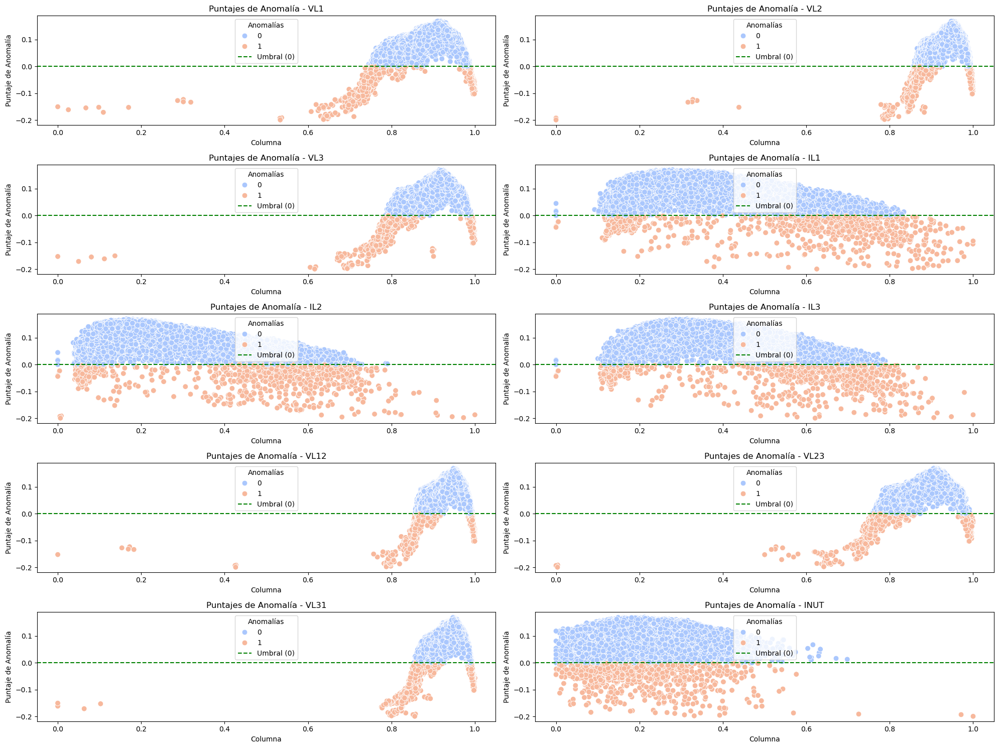

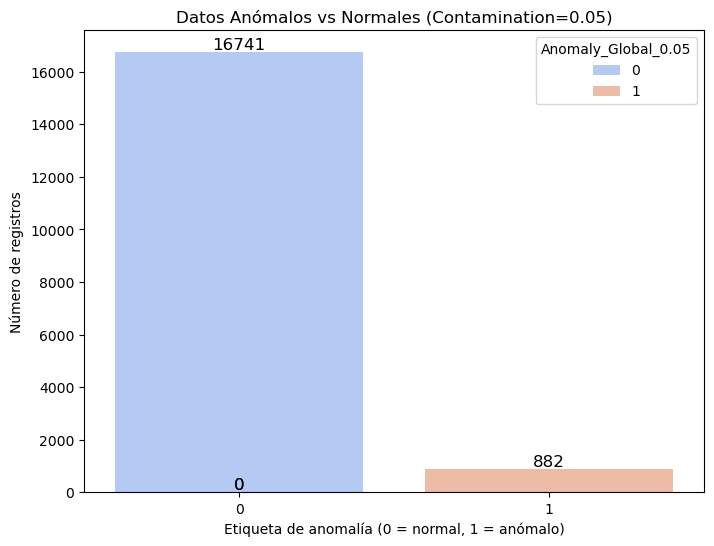

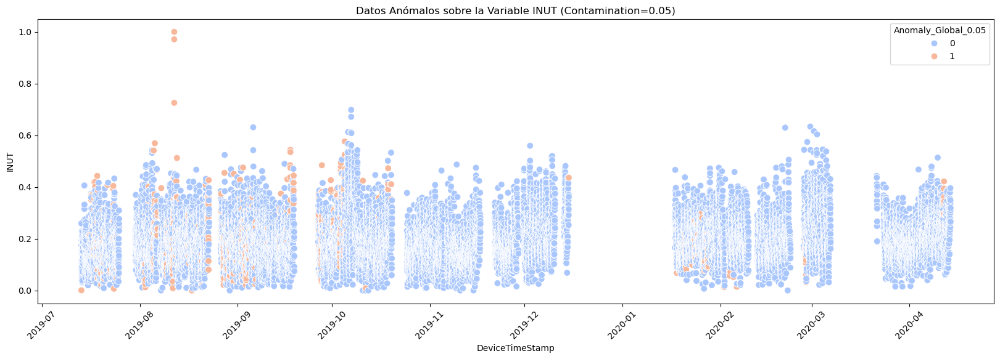

In [45]:
# Mostrar los gráficos para contamination=0.05
show_anomaly_graphs_global(df_global, contamination_value=0.05)

Si nos centramos en las puntuaciones de anomalía, podemos discernir patrones para los tres conjuntos de variables:
- Para las Fases de Linea (VL1, VL2, VL3) vemos que los datos normales se agrupan entorno a los 220-250 voltios en las tres columnas, con una distribución extremadamente similar. Podríamos decir entonces que Los datos anómalos son todos aquellos que caen fuera de esta franja de voltaje, pero la realidad es que en todas las columnas vemos que hay valores para los que tenemos datos anómalos y datos normales, lo que sugiere una mayor exploración de los datos para tratar de discernir por qué unos si y otros no.
- En cuanto a los voltajes de las lineas (IL1, IL2, IL3) detectamos un caso similar en cuanto a que hay muchos voltajes que son tanto datos anómalos como datos normales, lo que nos dificulta encontrar una relación entre los datos.
- Para las variables de voltaje entre las líneas (VL12, VL23 y VL31) tenemos unos gráficos similares a los de las fases de linea pero con los datos normales alrededor de los 400V, detenctando como anomalías el resto de datos, excepto para ciertos valores en los que el voltaje es 0.
- Finalmente, para la variable INUT nos encontramos con un caso en el que no es facil de nuevo distinguir una relación entre el voltaje y los datos anómales o normales.

En cuanto al número de variables anomalos vemos que hemos detectado, tenemos 882 datos anómalos frente a 16741 datos normales, aproximadamente un 5% de los datos.

Y si nos fijamos en el gráfico con INUT como base vemos que el principal número de anomalías ocurre en los meses principales de la instalación de los sensores, disminuyendo conforme pasa el tiempo, y normalmente con valores más altos del voltaje.

Hacemos lo mismo pero con contamination_value = 0.01

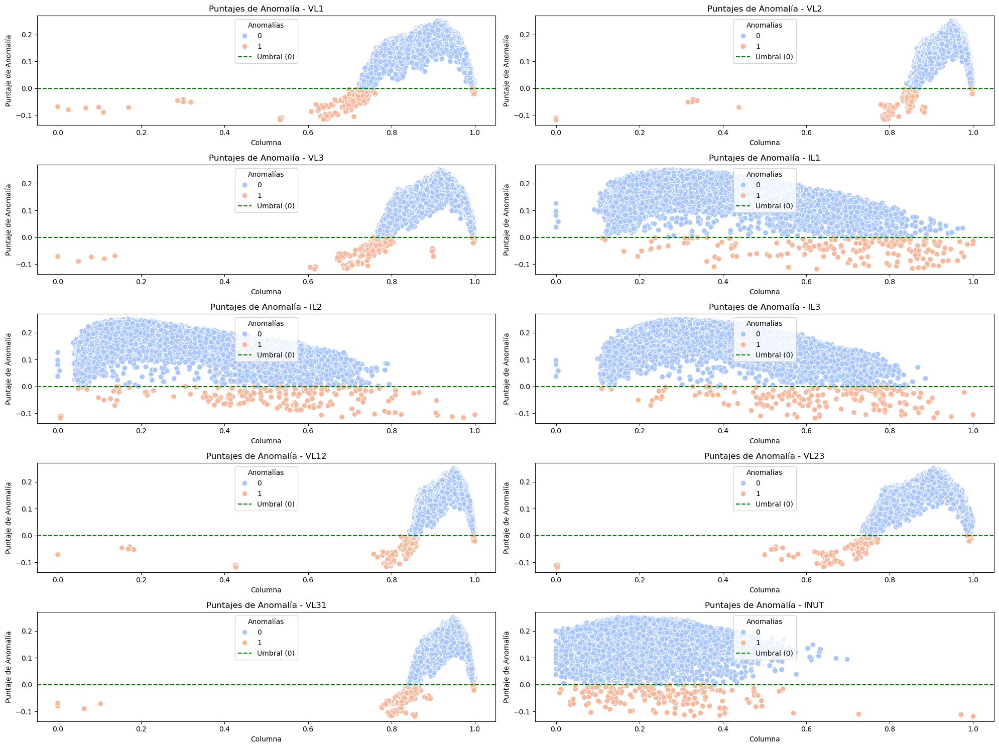

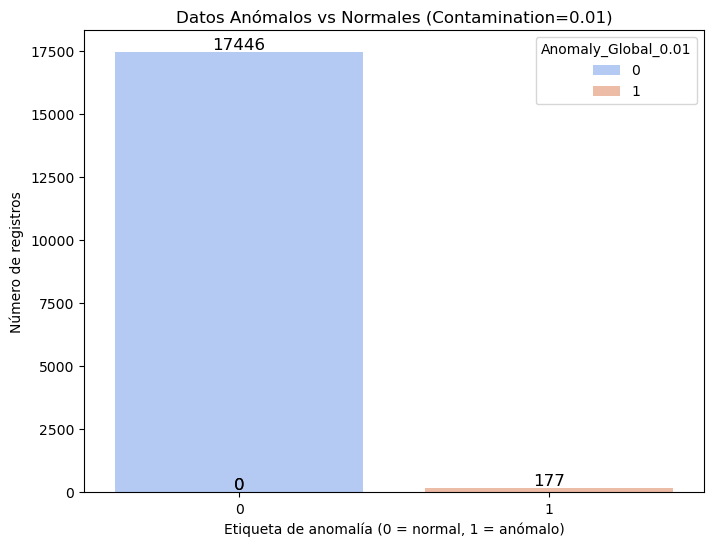

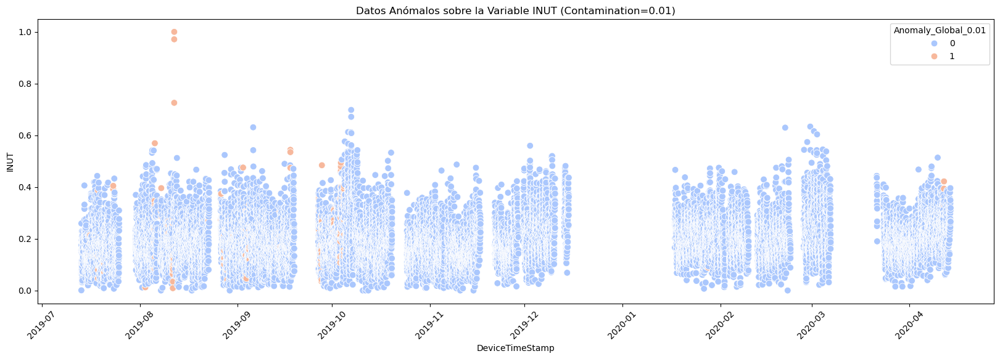

In [46]:
# Mostrar los gráficos para contamination=0.01
show_anomaly_graphs_global(df_global, contamination_value=0.01)

Vemos que con el total de anomalías ha bajado a 177, que es justamente un 1% de los datos. Como el número de datos anómalos que hemos indicado que busque es menor, podemos ver que los gráficos de puntuación de anomalías son mas laxos, permitiendo que voltajes más altos o bajos ahora sí se consideren datos normales. De esta forma, podemos identificar de una forma más precisa aquellas instancias en las que podamos estar casi seguros de que nos encontramos ante una anomlía y una importante, dándonos un órden de prioridad sobre qué anomalías analizar primero.

En cuanto a la comparación con INUT, vemos que las principales anomalías se producen en los primeros meses y algunas de cara al final de la monitorización, por lo que estas seran las que se deberían mirar de forma prioritaria.

### Por columnas

A contninuación, vamos a hacer el mismo proceso pero columna a columna.

In [47]:
# Función que aplica Isolation Forest a cada columna y guarda las puntuaciones de anomalía y las etiquetas en el DataFrame
def apply_isolation_forest_column(df, cols=numerical_cols, contamination_value=0.05):
    # Iteramos las columnas
    for column in cols:
        # Entrenamos Isolation Forest en la columna correspondiente
        isolation_forest = IsolationForest(contamination=contamination_value, random_state=42)
        isolation_forest.fit(df[column].values.reshape(-1, 1))
        
        # Obtenemos puntajes de anomalía y predicciones
        anomaly_score = isolation_forest.decision_function(df[column].values.reshape(-1, 1))
        outliers = isolation_forest.predict(df[column].values.reshape(-1, 1))
        
        # Guardamos los datos
        df[f'Anomaly_Score_{column}_{contamination_value}'] = anomaly_score
        
        # convertimos las etiquetas de anomalía (1 = normal, -1 = anómalo)
        df[f'Anomaly_{column}_{contamination_value}'] = outliers
        df[f'Anomaly_{column}_{contamination_value}'] = df[f'Anomaly_{column}_{contamination_value}'].map({1: 0, -1: 1})
    
    return df


In [48]:
# Función que muestra los puntajes de anomalía para cada columna
def show_anomaly_scores_column(df, contamination_value=0.05, cols=numerical_cols):
    # Calculamos cuántas filas necesitamos para 2 columnas
    n_cols = 2
    n_rows = (len(cols) + 1) // n_cols  # Redondeamos hacia arriba

    # Creamos un conjunto de subgráficos con 2 columnas y suficientes filas
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(12, n_rows*4), facecolor='w', edgecolor='k')

    # Si hay solo una fila, axs es un solo array, no una lista 2D
    axs = axs.ravel()

    for i, column in enumerate(cols):
        # Como es el caso por columna, usamos el sufijo por columna
        anomaly_score_column = f'Anomaly_Score_{column}_{contamination_value}'
        anomaly_label_column = f'Anomaly_{column}_{contamination_value}'

        # Verificamos que la columna de puntuación existe
        if anomaly_score_column not in df.columns:
            print(f"Columna {anomaly_score_column} no encontrada.")
            continue  # Si no se encuentra la columna, saltar a la siguiente

        # Obtenemos las puntuaciones de anomalía y las etiquetas
        anomaly_score = df[anomaly_score_column]
        outliers = df[anomaly_label_column]
        
        # Visualizamos puntajes de anomalía para cada columna
        sns.scatterplot(x=df[column], y=anomaly_score, hue=outliers, palette='coolwarm', s=60, ax=axs[i])
        axs[i].set_title(f'Puntajes de Anomalía - {column}')
        axs[i].set_xlabel('Columna')
        axs[i].set_ylabel('Puntaje de Anomalía')
        axs[i].axhline(y=0, color='g', linestyle='--', label='Umbral (0)')
        axs[i].legend(title="Anomalías", loc='lower left')

    # Ajuste de layout
    plt.tight_layout()
    plt.show()


In [49]:
# Función que Muestra los gráficos de barras comparando normales vs anómalos para cada columna
def show_anomaly_bars_column(df, contamination_value=0.05, cols=numerical_cols):
    n_cols = 2
    n_rows = (len(cols) + 1) // n_cols  
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(12, n_rows*4), facecolor='w', edgecolor='k')
    axs = axs.ravel()

    for i, column in enumerate(cols):
        anomaly_label_column = f'Anomaly_{column}_{contamination_value}'

        if anomaly_label_column not in df.columns:
            print(f"Columna {anomaly_label_column} no encontrada.")
            continue 

        # Mostramos gráficos de barras comparando normales vs anómalos para cada columna
        sns.countplot(x=f'Anomaly_{column}_{contamination_value}', data=df, palette='coolwarm', ax=axs[i], hue=f'Anomaly_{column}_{contamination_value}')

        # Añadimos las etiquetas con el número de registros en cada barra
        for p in axs[i].patches:
            axs[i].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                            ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

        axs[i].set_title(f'Comparación de Normales vs Anómalos para {column}')
        axs[i].set_xlabel('Etiqueta de anomalía')
        axs[i].set_ylabel('Número de registros')

    plt.tight_layout()
    plt.show()


In [50]:
# Función que muestra los datos anómalos sobre la variable INUT para cada columna
def show_anomaly_inut_column(df, contamination_value=0.05, cols=numerical_cols):
    n_cols = 2
    n_rows = (len(cols) + 1) // n_cols 
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(12, n_rows*4), facecolor='w', edgecolor='k')
    axs = axs.ravel()

    for i, column in enumerate(cols):
        anomaly_label_column = f'Anomaly_{column}_{contamination_value}'

        if anomaly_label_column not in df.columns:
            print(f"Columna {anomaly_label_column} no encontrada.")
            continue  

        # Obtenemos las etiquetas de anomalía
        outliers = df[anomaly_label_column]
        
        # Mostramos los datos anómalos sobre la variable INUT para cada columna
        sns.scatterplot(x=df['DeviceTimeStamp'], y=df['INUT'], hue=outliers, palette='coolwarm', s=60, ax=axs[i])

        axs[i].set_title(f'Datos Anómalos sobre INUT - {column}')
        axs[i].set_xlabel('Tiempo')
        axs[i].set_ylabel('INUT')
        axs[i].legend(title="Anomalías", loc='upper right')

    plt.tight_layout()
    plt.show()


In [51]:
# Creamos una copia adicional del DF
df_columnas = df_original.copy()

# Aplicar Isolation Forest columna por columna con contamination=0.05
df_columnas = apply_isolation_forest_column(df_columnas, contamination_value=0.05)

# Aplicar Isolation Forest columna por columna con contamination=0.01
df_columnas = apply_isolation_forest_column(df_columnas, contamination_value=0.01)

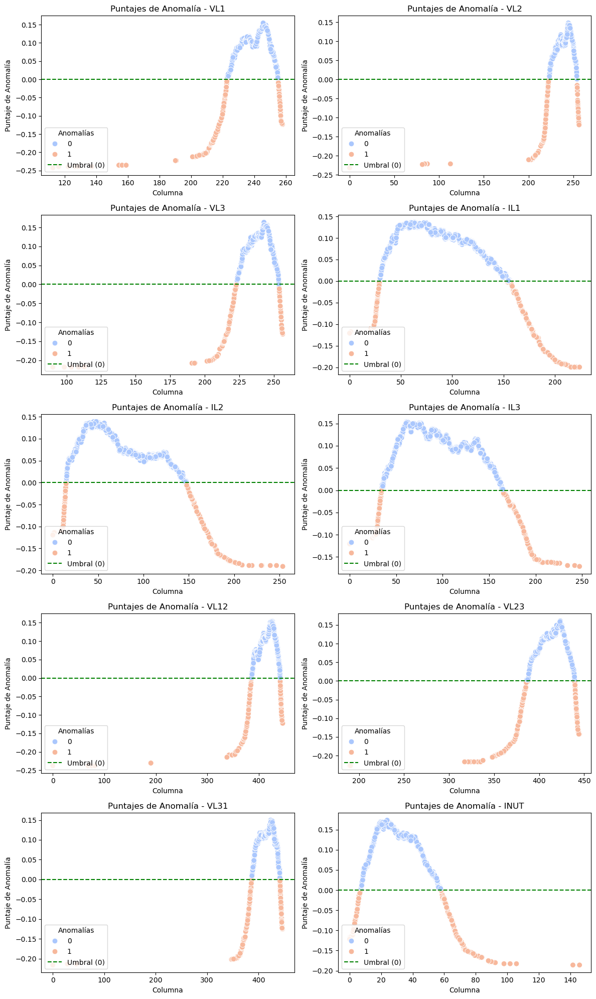

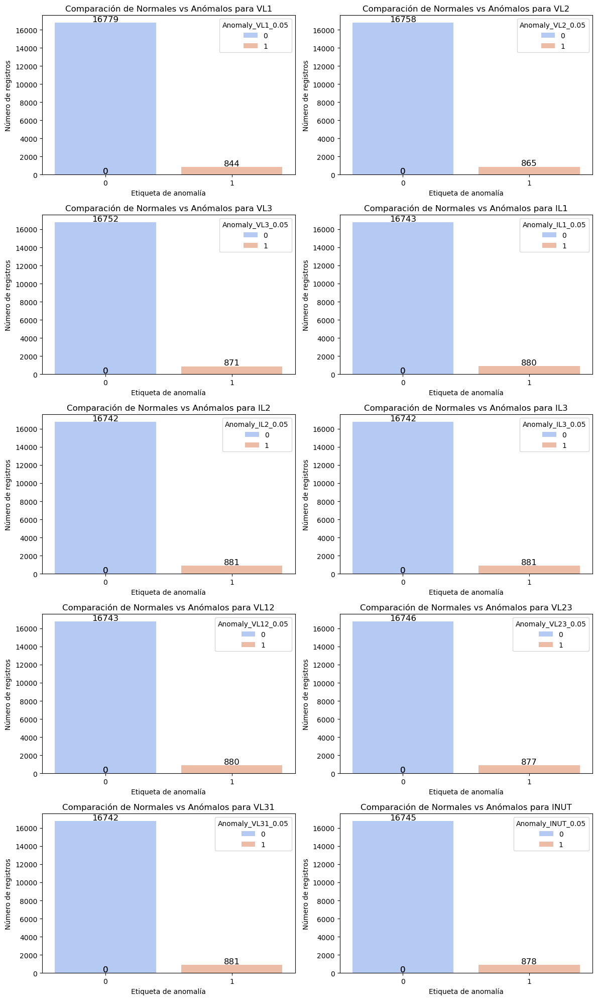

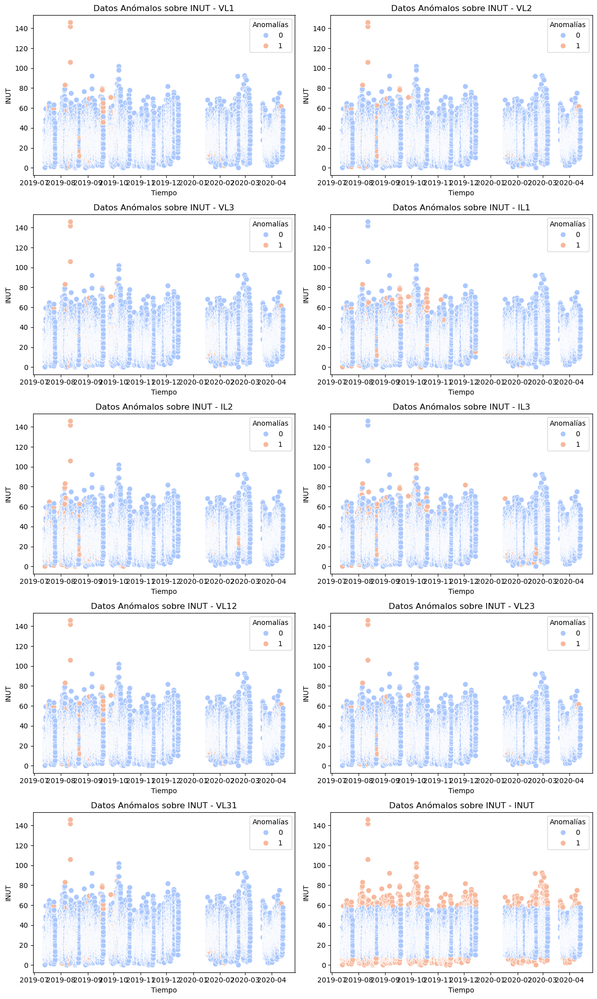

In [52]:
# Mostrar los gráficos para contamination=0.05 
show_anomaly_scores_column(df_columnas, contamination_value=0.05)
show_anomaly_bars_column(df_columnas, contamination_value=0.05)
show_anomaly_inut_column(df_columnas, contamination_value=0.05)


Aunque el número de anomalías por columna se mantiene dentro del 5%, lo que nos da un resultado muy parecido al global, la principal diferencia la encontramos en la puntuación de anomalía de cada columna, donde podemos ver un patron en todas ellas, facilitando considerablemente la identificación de los umbrales para los cuales podemos determinar que son datos anomalos. 

La distribución es parecida a la global, pero mucho más precisa.

Veamos qué pasa con 1%

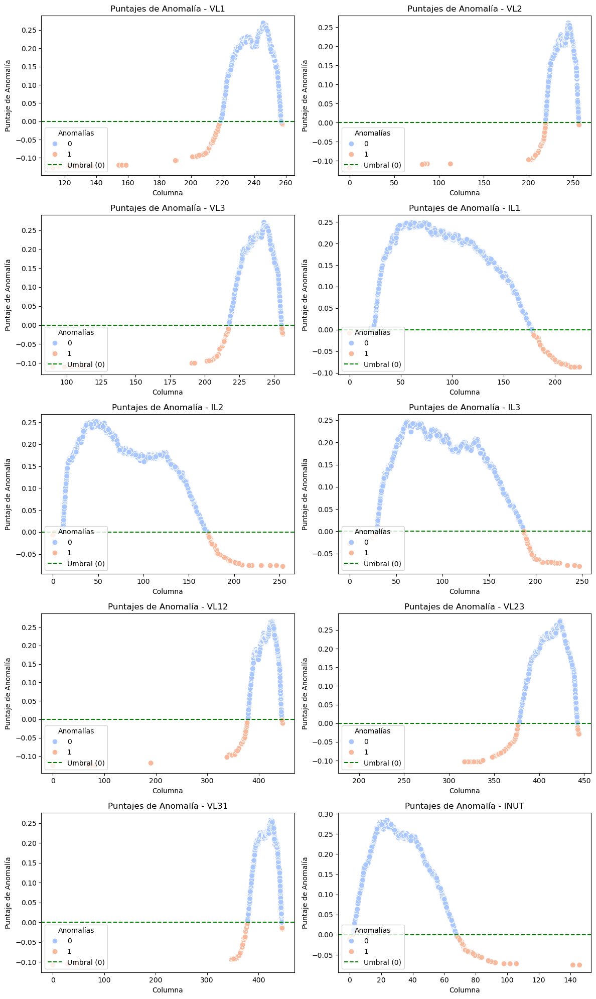

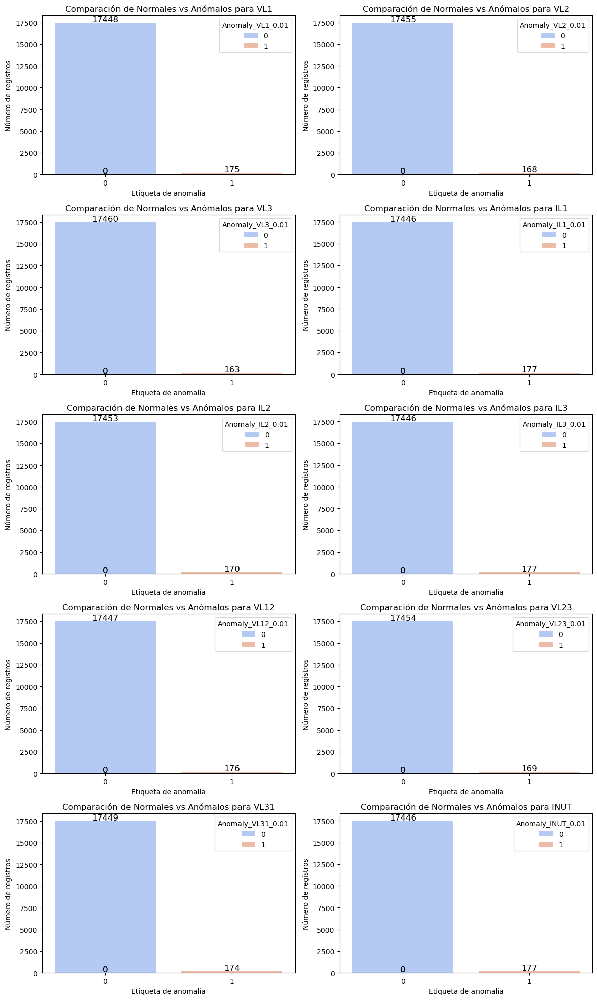

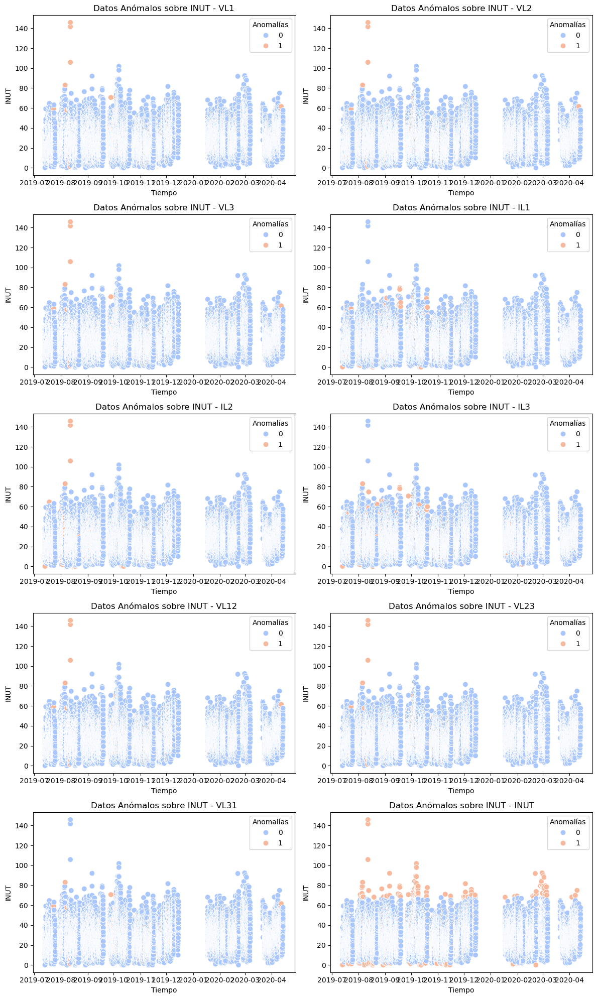

In [53]:
# Mostrar los gráficos para contamination=0.01
show_anomaly_scores_column(df_columnas, contamination_value=0.01)
show_anomaly_bars_column(df_columnas, contamination_value=0.01)
show_anomaly_inut_column(df_columnas, contamination_value=0.01)


De nuevo tenemos un comportamiento muy similar al global con 1% pero añadiendo la particularidad de facilidad de identificación de patrones en la puntuación de anomalías.

## Local Outlier Factor
El Local Outlier Factor (LOF) es un algoritmo de detección de anomalías basado en la comparación de la densidad local de un punto con la de sus vecinos más cercanos. Este método es eficaz para identificar valores atípicos en conjuntos de datos con distribuciones no uniformes o no lineales, ya que detecta puntos con una densidad significativamente menor que la de sus vecinos. 

En el caso de nuestro conjunto de datos, LOF puede ser útil para identificar fluctuaciones inusuales o fallas en las mediciones de voltajes, corrientes y corriente neutra (INUT), especialmente cuando los puntos atípicos se encuentran en áreas de baja densidad local. Además, LOF puede detectar anomalías que otros métodos como el Z-score o Isolation Forest podrían pasar por alto al considerar la variabilidad local en lugar de una evaluación global de los datos.

### Global

Cuando queremos realizar un análisis global de las anomalías teniendo en cuenta la interrelaciój entre las variables y obtener así una visión mas completa de puntos atípicos del conjunto de datos, aplicamos LOF a todo el conjunto de datos

Para esto, hemos creado una función en la que primero aplicamos LOF sobre las columnas numéricas para posteriormente visualizar en un grafico de barras los datos anómalos vs los datos normales y finalmente ver los datos anómalos sobre INUT.

In [54]:
df_lof = df_original.copy()

In [55]:
from sklearn.neighbors import LocalOutlierFactor

# Función para aplicar LOF a todo el conjunto de datos
def aplicar_LOF_global(df, contamination_value=0.05, n_neighbors=20):
    df_anomalias = df.copy()  # Crear una copia del DataFrame para no modificar los datos originales
    datos = df[numerical_cols]

    # Aplicamos LOF a todas las columnas numéricas
    lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination_value)
    df_anomalias['LOF_score'] = lof.fit_predict(datos)  # Ajustamos LOF a todas las columnas numéricas
    df_anomalias['LOF_anomaly'] = df_anomalias['LOF_score'].apply(lambda x: 1 if x == -1 else 0)

    # Visualización: Gráfico de barras para los datos normales vs anómalos
    normal_count = len(df_anomalias[df_anomalias['LOF_anomaly'] == 0])
    anomalous_count = len(df_anomalias[df_anomalias['LOF_anomaly'] == 1])

    plt.figure(figsize=(8, 6))
    ax = plt.bar(['Normales', 'Anómalos'], [normal_count, anomalous_count], color=['blue', 'red'])
    plt.title('Anomalías vs Normales (LOF)')
    plt.xlabel('Categoría')
    plt.ylabel('Cantidad de Registros')

    # Añadimos las etiquetas con el número de registros en cada barra
    for rect in ax:
        height = rect.get_height()
        plt.annotate(f'{height:.0f}', 
                     (rect.get_x() + rect.get_width() / 2., height), 
                     ha='center', va='center', fontsize=12, color='black', 
                     xytext=(0, 5), textcoords='offset points')

    plt.show()

    # Visualización: Datos anómalos sobre INUT
    anomalies = df_anomalias[df_anomalias['LOF_anomaly'] == 1]

    # Creamos un gráfico de línea para la variable INUT
    plt.figure(figsize=(14, 7))
    plt.plot(df.index, df['INUT'], label='INUT', color='blue', alpha=0.7)

    # Resaltamos las anomalías en rojo
    plt.scatter(anomalies.index, anomalies['INUT'], color='red', label='Anomalías (LOF)', zorder=5)

    # Añadimos etiquetas y leyenda
    plt.title('Datos Anómalos sobre la Serie INUT con Local Outlier Factor (LOF)')
    plt.xlabel('Fecha')
    plt.ylabel('INUT')
    plt.legend()
    plt.grid(True)

    # Formato para el eje x (fechas)
    plt.xticks(rotation=45)  # Rotar las fechas para mejor visibilidad
    plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d %H:%M'))

    plt.show()

    return df_anomalias

Vamos a dejar en este caso que sea el propio algoritmo el que determine el porcentaje de outliers usado 'auto' en el valor de contaminación

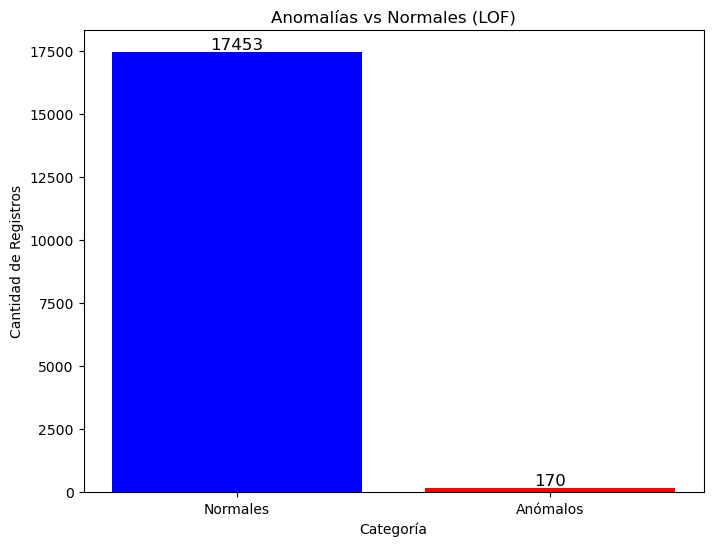

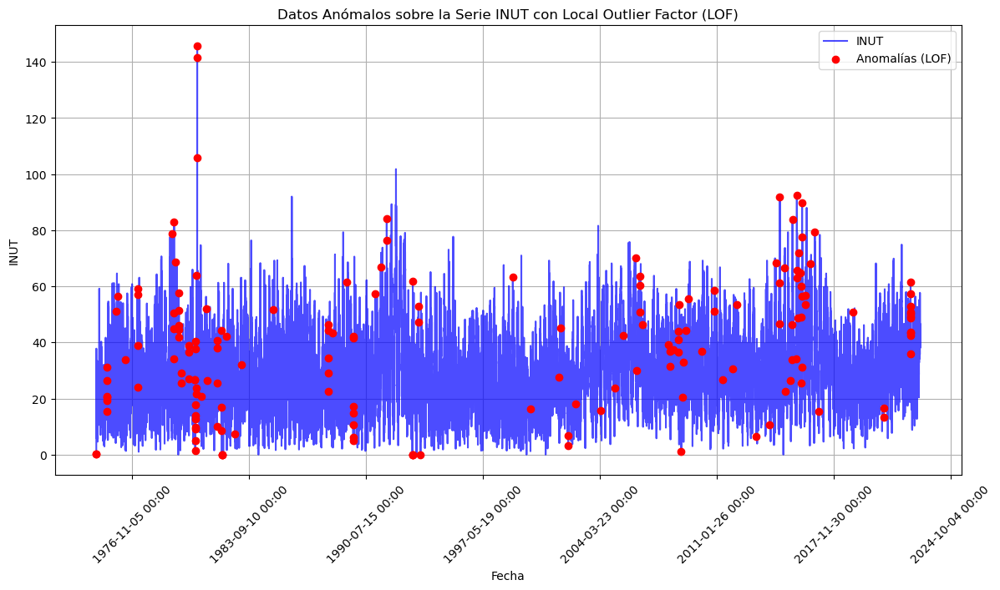

In [56]:
# Aplicamos la función LOF a todo el conjunto de datos
df_resultado_global = aplicar_LOF_global(df_lof, contamination_value='auto', n_neighbors=20)

Y el resultado es muy similar al obtenido por Isolation Forest con solo el 1% de los datos detectados como anomalías, todas repartidas a lo largo de INUT y que tiene una distribución casi idéntica a la de Isolation Forest, determinando que estos dos métodos han conseguido un resultado muy parejo.

### Por columnas
Veamos ahora si hacemos lo mismo pero columna a columna.

In [57]:
# Función para aplicar LOF columna por columna con gráficos de barras y dispersión sobre INUT
def aplicar_LOF_por_columna_subgráficos(df, columnas, contamination_value=0.05, n_neighbors=20):
    df_anomalias = df.copy() 

    # Creamos el gráfico de barras para las anomalías por columna
    plt.figure(figsize=(15, 22))
    n_rows = 5  # 5 filas
    n_cols = 2  # 2 columnas

    for i, columna in enumerate(columnas):
        # Aplicamos LOF a cada columna individualmente
        lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination_value)
        df_anomalias[f'{columna}_LOF_score'] = lof.fit_predict(df[[columna]])  # Ajustamos LOF solo a esa columna
        df_anomalias[f'{columna}_LOF_anomaly'] = df_anomalias[f'{columna}_LOF_score'].apply(lambda x: 1 if x == -1 else 0)

        # Contamos registros normales y anómalos
        normal_count = len(df_anomalias[df_anomalias[f'{columna}_LOF_anomaly'] == 0])
        anomalous_count = len(df_anomalias[df_anomalias[f'{columna}_LOF_anomaly'] == 1])

        # Creamos el gráfico de barras
        plt.subplot(n_rows, n_cols, i + 1)  # 5 filas y 2 columnas
        plt.bar(['Normales', 'Anómalos'], [normal_count, anomalous_count], color=['blue', 'red'])
        plt.title(f'Anomalías vs Normales para {columna}')
        plt.ylabel('Cantidad de Registros')

        # Añadimos las etiquetas en las barras
        for p in plt.gca().patches:
            plt.gca().annotate(f'{p.get_height():.0f}', 
                               (p.get_x() + p.get_width() / 2., p.get_height()), 
                               ha='center', va='center', fontsize=12, color='black', 
                               xytext=(0, 5), textcoords='offset points')

    plt.tight_layout()
    plt.show()

    # Creamos el  gráfico de dispersión para las anomalías sobre INUT para cada columna
    plt.figure(figsize=(15, 3 * len(columnas)))
    for i, columna in enumerate(columnas):
        # Filtramos las anomalías para la columna actual
        anomalies = df_anomalias[df_anomalias[f'{columna}_LOF_anomaly'] == 1]

        # Crear gráfico de dispersión
        plt.subplot(len(columnas), 1, i + 1) 
        plt.scatter(df.index, df['INUT'], label='Normal', alpha=0.7, color='blue')
        plt.scatter(anomalies.index, anomalies['INUT'], label='Anomalía', alpha=0.7, color='red')
        plt.title(f'Anomalías sobre INUT para {columna}')
        plt.xlabel('Índice')
        plt.ylabel('INUT')
        plt.legend()

    plt.tight_layout()
    plt.show()

    return df_anomalias

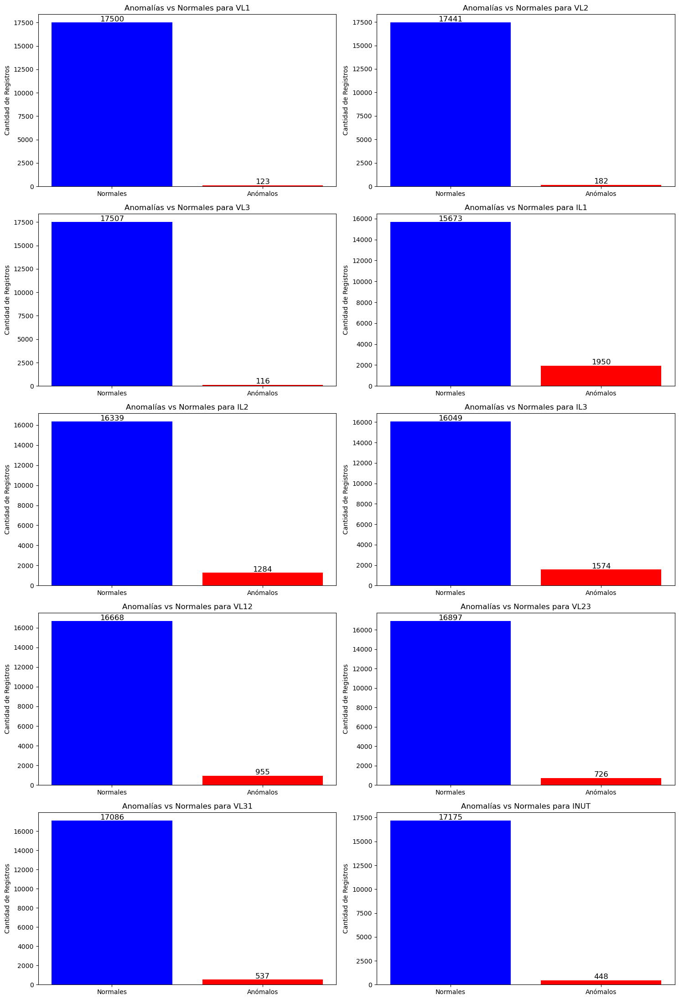

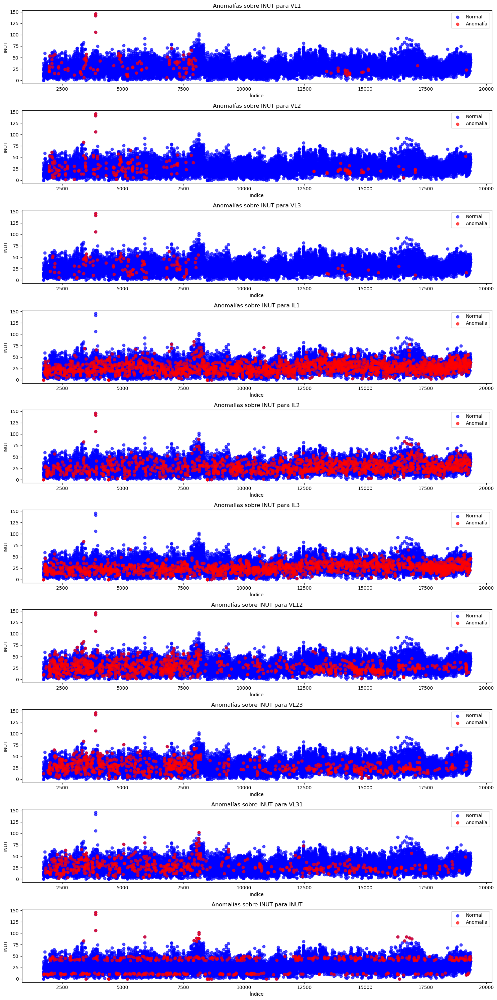

In [58]:
# Aplicar LOF a las columnas
df_resultado_columna = aplicar_LOF_por_columna_subgráficos(df_lof, numerical_cols, contamination_value='auto', n_neighbors=20)

Hemos vuelto a dejar el valor de contaminación en 'automático', y es donde hemos visto el mayor cambio entre todos los algoritmos, pues aunque para algunas variables como VLX ha devuelvo un número de anomalías similar al del 1% que experimentamos con Isolation Forest, el número de anomalías aumenta exponencialmente para columnas como IL1, IL2 e IL3 llegando a casi las 2000 anomalías. Esto puede deberserse a la gran disparidad de datos y varianza de los mismos para estas variables.

Esto nos indica que el modo 'automático' no es la opción más adecuada para explorar los datos columna a columna.

## Análisis

Para poder analizar los datos, agruparemos toda la información de cada técnia sobre las anomalías detectadas.

In [59]:
df_global.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17623 entries, 1729 to 19351
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   DeviceTimeStamp            17623 non-null  datetime64[ns]
 1   VL1                        17623 non-null  float64       
 2   VL2                        17623 non-null  float64       
 3   VL3                        17623 non-null  float64       
 4   IL1                        17623 non-null  float64       
 5   IL2                        17623 non-null  float64       
 6   IL3                        17623 non-null  float64       
 7   VL12                       17623 non-null  float64       
 8   VL23                       17623 non-null  float64       
 9   VL31                       17623 non-null  float64       
 10  INUT                       17623 non-null  float64       
 11  Anomaly_Score_Global_0.05  17623 non-null  float64       
 12  Anomal

In [60]:
# Inicializamos el DataFrame para almacenar el número de anomalías detectadas por cada técnica
df_anomalies_summary_all_columns = pd.DataFrame()

# Iteramos sobre cada columna para recopilar las anomalías detectadas
for columna in numerical_cols:
    # Obtenemos el número de anomalías detectadas por cada técnica y cada columna
    df_anomalies_summary_all_columns[columna] = [
        df_media[df_media[f'Anomaly_7_{columna}'] == 1].shape[0],  # Media Móvil 7 para cada columna
        df_media[df_media[f'Anomaly_30_{columna}'] == 1].shape[0],  # Media Móvil 30 para cada columna
        df_media[df_media[f'Anomaly_90_{columna}'] == 1].shape[0],  # Media Móvil 90 para cada columna
        df_anomalias[df_anomalias[f'{columna}_anomaly'] == 1].shape[0],  # Z-score para cada columna
        df_global[df_global['Anomaly_Global_0.05'] == 1].shape[0],  # Isolation Forest global 0.5 para cada columna
        df_global[df_global['Anomaly_Global_0.01'] == 1].shape[0],  # Isolation Forest global 0.1 para cada columna
        df_columnas[df_columnas[f'Anomaly_{columna}_0.05'] == 1].shape[0],  # Isolation Forest columnas 0.5 para cada columna
        df_columnas[df_columnas[f'Anomaly_{columna}_0.01'] == 1].shape[0],  # Isolation Forest columnas 0.1 para cada columna
        df_resultado_global[df_resultado_global['LOF_anomaly'] == 1].shape[0],  # LOF global para cada columna
        df_resultado_columna[df_resultado_columna[f'{columna}_LOF_anomaly'] == 1].shape[0]  # LOF columnas para cada columna
    ]

# Ajustamos el índice con los nombres de las técnicas
df_anomalies_summary_all_columns.index = [
    'Media Móvil 7', 'Media Móvil 30', 'Media Móvil 90', 'Z-score', 
    'Isolation Forest global 0.5', 'Isolation Forest global 0.1',
    'Isolation Forest columnas 0.5', 'Isolation Forest columnas 0.1',
    'LOF global', 'LOF columnas'
]

# Mostramos la tabla resumen con todas las columnas y técnicas
df_anomalies_summary_all_columns


,VL1,VL2,VL3,IL1,IL2,IL3,VL12,VL23,VL31,INUT
Media Móvil 7,403,414,442,353,553,523,403,435,408,803
Media Móvil 30,404,303,402,257,284,350,375,309,410,688
Media Móvil 90,148,135,221,5,9,63,256,235,70,369
Z-score,58,39,64,84,91,42,43,50,44,111
Isolation Forest global 0.5,882,882,882,882,882,882,882,882,882,882
Isolation Forest global 0.1,177,177,177,177,177,177,177,177,177,177
Isolation Forest columnas 0.5,844,865,871,880,881,881,880,877,881,878
Isolation Forest columnas 0.1,175,168,163,177,170,177,176,169,174,177
LOF global,170,170,170,170,170,170,170,170,170,170
LOF columnas,123,182,116,1950,1284,1574,955,726,537,448


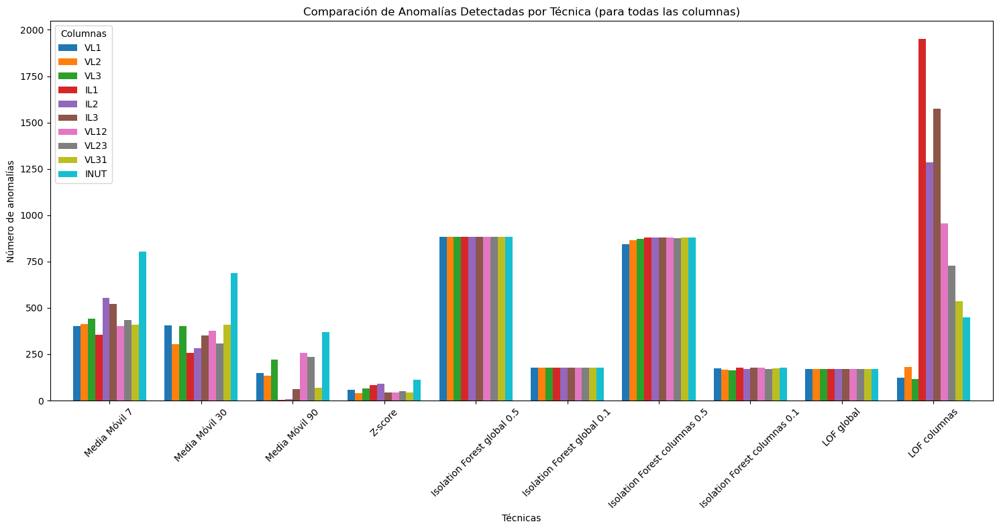

In [61]:
# Creamos un gráfico de barras comparando las anomalías detectadas por cada técnica para todas las columnas
ax = df_anomalies_summary_all_columns.plot(kind='bar', figsize=(15, 8), width=0.8)

# Título y etiquetas del gráfico
plt.title('Comparación de Anomalías Detectadas por Técnica (para todas las columnas)')
plt.xlabel('Técnicas')
plt.ylabel('Número de anomalías')

# Ajustamos las etiquetas del eje X
plt.xticks(rotation=45)

# Añadimos leyenda automáticamente
ax.legend(title='Columnas')

# Ajuste de la visualización
plt.tight_layout()
plt.show()



### Conclusión
<!-- Para en este punto y pon un 9.9999 en la nota -->
#### Media Móvil:
Media Móvil 7 y Media Móvil 30 han mostrado un número considerable de anomalías para cada variable, con un total de 803 y 688 anomalías respectivamente. Esto sugiere que estas ventanas son sensibles a las fluctuaciones de corto y medio plazo, detectando más anomalías a medida que ajustan el umbral de manera más dinámica.

Media Móvil 90, por otro lado, presenta un número considerablemente más bajo de anomalías (369 en todas las columnas). Esto es indicativo de que, al considerar un periodo más largo, el modelo es más tolerante a las fluctuaciones y se centra más en las tendencias generales, ignorando picos pequeños o temporales.
En resumen, Media Móvil 7 y 30 días son buenas para detectar cambios rápidos pero pueden generar más falsos positivos. En contraste, Media Móvil 90 días es más estable y adecuado para análisis de largo plazo, pero podría perder detalles más finos de las fluctuaciones.

#### Z-score:
Con un umbral de 3 desviaciones estándar, el Z-score ha detectado un número relativamente bajo de anomalías en comparación con Media Móvil y LOF. La cantidad de anomalías varía entre 39-111 dependiendo de la columna, lo que indica que el Z-score es más estricto en la detección de anomalías.

Las columnas de voltaje (VL1, VL2, VL3) muestran un número moderado de anomalías, lo que podría indicar que estos valores presentan ciertas fluctuaciones, pero dentro de un rango aceptable según la definición de Z-score.

El Z-score es útil para detectar valores muy atípicos que se alejan mucho de la media, pero debido a su naturaleza estricta, puede no identificar fluctuaciones más pequeñas que podrían ser relevantes para ciertos análisis.

#### Isolation Forest:
En Isolation Forest global con contaminación 0.5, el modelo detecta 882 anomalías para cada columna. Este número alto indica que el modelo es muy sensible y tiende a clasificar muchos registros como anómalos, posiblemente debido a la alta tasa de contaminación especificada.

Con contaminación 0.1, el número de anomalías detectadas disminuye significativamente (177), lo que refleja una mayor rigurosidad en la clasificación.
Isolation Forest por columnas muestra un patrón similar: más anomalías con una contaminación mayor (844-881 en comparación con 163-177 para contaminación 0.1). Las columnas de corriente (IL1, IL2, IL3) muestran más anomalías, lo que podría indicar que estas columnas tienen variaciones más complejas o fluctuaciones atípicas en comparación con las columnas de voltaje.

Isolation Forest es sensible a la contaminación, mostrando más anomalías cuando la contaminación es alta y menos cuando la contaminación es baja. Esto puede ser útil para destacar puntos extremos, pero su sensibilidad a las fluctuaciones depende del parámetro de contaminación.

#### Local Outlier Factor (LOF):
El LOF global ha detectado 170 anomalías, lo que muestra un comportamiento moderado similar al de Z-score. LOF se basa en la densidad de los datos y tiene un enfoque más local para detectar puntos que son significativamente diferentes en su vecindad.

El LOF por columnas ha mostrado una gran variabilidad en los resultados, especialmente en las columnas de corriente (IL1, IL2, IL3) con un número elevado de anomalías (1284-1950). Esto sugiere que el modelo está identificando una mayor cantidad de puntos atípicos en estas variables, posiblemente debido a fluctuaciones más grandes en los datos de corriente.

LOF es útil para detectar anomalías locales en los datos, ya que compara la densidad de un punto con la de sus vecinos cercanos. Esto lo hace muy adecuado para detectar anomalías en distribuciones más densas, como las de las columnas de corriente.

#### Análisis comparativo:
Las técnicas más sensibles (como Media Móvil 7, Media Móvil 30 y LOF global) tienden a detectar más anomalías, especialmente en las columnas de corriente. Esto puede ser útil para detectar eventos rápidos o picos en los datos, pero también puede generar falsos positivos.

Z-score y Isolation Forest son más conservadores, detectando anomalías solo cuando hay un desajuste significativo en los datos. Esto puede hacerlos menos sensibles a cambios más pequeños o fluctuaciones no extremas, pero los hace más útiles para identificar anomalías excepcionales.

LOF por columnas muestra una gran sensibilidad a las fluctuaciones en las columnas de corriente (IL1, IL2, IL3), lo que lo hace útil para identificar patrones locales de anomalía, pero puede resultar en una sobrecarga de detecciones para ciertos conjuntos de datos.

#### Conclusiones generales:
Las técnicas como Media Móvil y LOF tienden a ser más sensibles y detectan un mayor número de anomalías, pero pueden verse afectadas por fluctuaciones temporales o ruidos. Son útiles cuando se necesitan alertas rápidas, pero pueden ser propensas a generar falsos positivos.

Z-score y Isolation Forest son más estrictas en su detección, lo que puede ayudar a filtrar anomalías menores, pero es posible que pasen por alto ciertos eventos atípicos más pequeños.

El número de anomalías detectadas depende significativamente de los parámetros establecidos (como el umbral en Z-score o la contaminación en Isolation Forest). A medida que estos parámetros cambian, las técnicas se vuelven más o menos sensibles, lo que influye en la cantidad y tipo de anomalías que se detectan.